In [1]:
import pandas, seaborn, scipy, numpy, matplotlib, sklearn, collections, itertools, math, functools, sys

import stanity

%matplotlib inline
from matplotlib import pyplot
matplotlib.rc("savefig", dpi=800)
#matplotlib.rc("savefig", dpi=72)

from sklearn import preprocessing

# Constants
library_sizes = {
    'WGS': 3002000000,
    'WES': 50160183,
}
mhc_binding_threshold_affinity = 500

def bootstrap(values, statistic=numpy.mean, samples=5000):
    values = pandas.Series(values).dropna()
    if len(values) <= 1:
        return (numpy.nan, numpy.nan)
    values = [statistic(sklearn.utils.resample(values)) for i in range(samples)]
    return (numpy.percentile(values, 5), numpy.percentile(values, 95))

def round_to_n(x, n):
    return round(x, -int(math.floor(math.log10(x))) + (n - 1)) 

def mean_with_errorbars(values, decimals=0):
    pattern = "%%0.%df" % decimals
    bars = bootstrap(values)
    if numpy.nan in bars:
        return pattern % numpy.mean(values)
    if decimals == 0:
        bars = (round_to_n(bars[0], 2), round_to_n(bars[1], 2)) 
    return (pattern + " (" + pattern + " - " + pattern + ")") % ((numpy.mean(values),) + bars)

pandas.set_option('display.max_columns', 500)


def print_full(x):
    pandas.set_option('display.max_rows', len(x))
    print(x)
    pandas.reset_option('display.max_rows')

/usr/local/lib/python2.7/dist-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
df = pandas.read_csv("../data/sources.extended.csv", index_col="source_id")
df = df.ix[~pandas.isnull(df.mutations)]
df.head()

,Unnamed: 0,index,donor,cohort,library,treated,timepoint,metastasis,tissue_type,interval_days,assay,paired,timepoint_paired,protein changing,peptides,expressed peptides,mutations,mutations_per_mb,indel,interesting mutations,group,treatment,fraction_peptides_expressed,project_code,study_specimen_involved_in,submitted_specimen_id,icgc_donor_id,submitted_donor_id,specimen_type,specimen_type_other,specimen_interval,specimen_donor_treatment_type,specimen_donor_treatment_type_other,specimen_processing,specimen_storage,tumour_confirmed,tumour_histological_type,tumour_grading_system,tumour_grade,tumour_stage_system,tumour_stage,percentage_cellularity,level_of_cellularity
source_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AOCS-001-1/SP101515,0,SP101515,AOCS-001,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,50,128,71.0,5937,1.977682,1.0,19.302678,AOCS solid,treatment naive,0.554688,OV-AU,PCAWG,AOCS-001-1,DO46325,AOCS-001,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,3.0,FIGO,III,73.0,61-80%
AOCS-002-1/SP101517,1,SP101517,AOCS-002,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,11,32,NaN,1532,0.510326,0.0,17.297650,AOCS solid,treatment naive,NaN,OV-AU,PCAWG,AOCS-002-1,DO46326,AOCS-002,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,2.0,FIGO,III,85.0,>81%
AOCS-004-1/SP101519,2,SP101519,AOCS-004,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,57,58,20.0,6786,2.260493,1.0,16.931919,AOCS solid,treatment naive,0.344828,OV-AU,PCAWG,AOCS-004-1,DO46327,AOCS-004,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,3.0,FIGO,III,77.0,61-80%
AOCS-005-1/SP101521,3,SP101521,AOCS-005,AOCS,WGS,False,primary,False,solid,0.0,WGS,False,False,39,61,39.0,5703,1.899734,2.0,15.640891,AOCS solid,treatment naive,0.639344,OV-AU,PCAWG,AOCS-005-1,DO46328,AOCS-005,Primary tumour - solid tissue,NaN,0,no treatment,NaN,fresh,"frozen, vapor phase",no,8441/3,Silverberg,3.0,FIGO,III,90.0,>81%
AOCS-034-13/SP101524,4,SP101524,AOCS-034,AOCS,WGS,True,recurrence,False,ascites,1597.0,WGS,True,True,123,267,136.0,13626,4.538974,5.0,17.906943,AOCS ascites,chemo treated,0.509363,OV-AU,NaN,AOCS-034-13,DO46329,AOCS-034,Recurrent tumour - other,recurrent ascitic fluid,1597,other therapy,Surgery and Chemotherapy,fresh,"frozen, vapor phase",no,8140/3,NaN,NaN,NaN,NaN,99.0,>81%


In [3]:
#seaborn.lmplot(data=df, x="percentage_cellularity", y="mutations", hue="tissue_type")

In [4]:
predicted = ["mutations", "peptides", "expressed peptides"]

# donor is handled specially
predictors = [
    "treated",
#    "timepoint",
#    "metastasis",
#    "specimen_interval",
    "tissue_type",
#    "tumour_grade",
#    "tumour_stage",
    "percentage_cellularity"
]

In [5]:
def make_data(y_column):
    stan_df = df[[y_column, "donor"] + predictors].copy()
    stan_df.columns = ["y"] + list(stan_df.columns[1:])
    stan_df["y"] = numpy.log(stan_df["y"])
    original_donors = stan_df.donor
    stan_df["low_cellularity"] = stan_df.percentage_cellularity < stan_df.dropna().percentage_cellularity.quantile(.25)
    del stan_df["percentage_cellularity"]
    stan_df["solid"] = stan_df["tissue_type"] == "solid"
    del stan_df["tissue_type"]
    stan_df["num_sources_for_donor"] = pandas.Series(
        [(original_donors == donor).sum() for donor in original_donors],
        index=original_donors.index)

    stan_df = stan_df.dropna()
    stan_df["donor"] = stan_df.donor.astype('category').values.codes
    stan_df["solid and treated"] = (stan_df.solid) & (stan_df.treated)
    return stan_df

data_by_predicted = collections.OrderedDict()
for col in predicted:
    data_by_predicted[col] = make_data(col)
    print(col, data_by_predicted[col].shape)
data_by_predicted["mutations"].head()  

('mutations', (115, 7))
('peptides', (115, 7))
('expressed peptides', (98, 7))


,y,donor,treated,low_cellularity,solid,num_sources_for_donor,solid and treated
source_id,,,,,,,
AOCS-001-1/SP101515,8.688959,0,False,True,True,1,False
AOCS-002-1/SP101517,7.334329,1,False,False,True,1,False
AOCS-004-1/SP101519,8.822617,2,False,True,True,1,False
AOCS-005-1/SP101521,8.648748,3,False,False,True,1,False
AOCS-034-13/SP101524,9.519735,4,True,False,False,2,False


In [6]:
# stan model
model1 = """
data {
    // Data sizes
    int<lower=0> num_sources;
    int<lower=0> num_predictors;
    int<lower=0> num_donors;

    // Data
    vector[num_predictors] predictors[num_sources];
    int<lower=0> donors[num_sources];
    real y[num_sources];  // predicted variable
    int<lower=1> num_sources_for_donor[num_sources];
}
parameters {
    real global_mean;
    real<lower=0> donor_sigma;
    real<lower=0> sample_sigma;
    vector[num_donors] donor_mean;    
    vector[num_predictors] predictor_coefficients;
}
transformed parameters {
    real lp;
    real mu[num_sources];
    
    for (i in 1:num_sources) {
        lp <- dot_product(predictors[i], predictor_coefficients);
        if (num_sources_for_donor[i] > 1) {
            mu[i] <- donor_mean[donors[i]] + lp;
        } else {
            mu[i] <- global_mean + lp;
        }
    }
}
model {
    global_mean ~ normal(0, 100);
    donor_sigma ~ cauchy(0, 2);
    sample_sigma ~ cauchy(0, 2);
    donor_mean ~ normal(global_mean, donor_sigma);
    predictor_coefficients ~ normal(0, 20);
    y ~ normal(mu, sample_sigma);    
}
generated quantities {
    real y_rep[num_sources];
    real log_lik[num_sources];
    
    for (i in 1:num_sources) {
        // not sure if these are vectorized
        y_rep[i] <- normal_rng(mu[i], sample_sigma);
        log_lik[i] <- normal_log(y[i], mu[i], sample_sigma);
    }
}
""".strip()

data = {    

}
def init(data):
    return {
        'global_mean': 0.0,
        'donor_sigma': 1.0,
        'sample_sigma': 1.0,
        'donor_mean': numpy.zeros(data['num_donors']),
        'predictor_coefficients': numpy.random.normal(0, .1, size=(data['num_predictors'],)),
    }

for (i, line) in enumerate(model1.split("\n")):
    print("%3d %s" % (i + 1, line))

def print_dict(d):
    for key in [key for key in d if not isinstance(d[key], numpy.ndarray)]:
        print("%s: %s" % (key, d[key]))
    for key in [key for key in d if isinstance(d[key], numpy.ndarray)]:
        print("%s: %s mean=%s std=%s" % (key,  d[key].shape, d[key].mean(), d[key].std()))

fit_results = {}
for (y_label, raw_data) in data_by_predicted.items():
    print("+" * 40)
    print("RUNNING MODEL FOR: %s" % y_label)
    df_x = raw_data[[x for x in list(raw_data.columns) if x not in ("y", "donor")]].astype(float)
    data = {
        'num_sources': len(raw_data.index),
        'num_predictors': len(df_x.columns),
        'num_donors': raw_data.donor.nunique(),

        'predictors': df_x.values.astype(float),
        'donors': raw_data.donor.values + 1,  # convert to 1-indexed
        'num_sources_for_donor': raw_data.num_sources_for_donor.values,
        'y': raw_data.y.values,
    }
    print("")
    print("*" * 40)
    print("DATA")
    print_dict(data)
    print("")

    print("*" * 40)
    print("INITIAL VALUES")
    print_dict(init(data))
    sys.stdout.flush()
    
    fit_results[y_label] = stanity.fit(model_code=model1, data=data, init=lambda: init(data), iter=10000, chains=2)
    print("Done with fit.")
print("DONE")


  1 data {
  2     // Data sizes
  3     int<lower=0> num_sources;
  4     int<lower=0> num_predictors;
  5     int<lower=0> num_donors;
  6 
  7     // Data
  8     vector[num_predictors] predictors[num_sources];
  9     int<lower=0> donors[num_sources];
 10     real y[num_sources];  // predicted variable
 11     int<lower=1> num_sources_for_donor[num_sources];
 12 }
 13 parameters {
 14     real global_mean;
 15     real<lower=0> donor_sigma;
 16     real<lower=0> sample_sigma;
 17     vector[num_donors] donor_mean;    
 18     vector[num_predictors] predictor_coefficients;
 19 }
 20 transformed parameters {
 21     real lp;
 22     real mu[num_sources];
 23     
 24     for (i in 1:num_sources) {
 25         lp <- dot_product(predictors[i], predictor_coefficients);
 26         if (num_sources_for_donor[i] > 1) {
 27             mu[i] <- donor_mean[donors[i]] + lp;
 28         } else {
 29             mu[i] <- global_mean + lp;
 30         }
 31     }
 32 }
 33 model {
 34     global

In [7]:
all_fit_coefficients = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    fit_coefficients = pandas.DataFrame(numpy.exp(extracted['predictor_coefficients']),
                           columns=list(data_by_predicted[y_label].columns)[2:])
    fit_coefficients["y_label"] = y_label
    all_fit_coefficients.append(fit_coefficients)
all_fit_coefficients = pandas.concat(all_fit_coefficients, ignore_index=True)
all_fit_coefficients.head()

,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,y_label
0,0.930375,1.101644,0.614012,1.332986,0.815851,peptides
1,1.414997,1.230841,1.047655,1.504463,0.677428,peptides
2,0.950636,0.981431,0.497897,1.775560,1.276395,peptides
3,1.116694,0.935859,0.616274,1.355278,0.815544,peptides
4,2.098219,0.914631,1.019464,1.359942,0.467360,peptides


#### plot coefficient values by outcome type

In [8]:
melted = pandas.melt(all_fit_coefficients, id_vars=["y_label"])

In [9]:
1 - (all_fit_coefficients.treated <= 1.05).mean()

0.92303333333333337

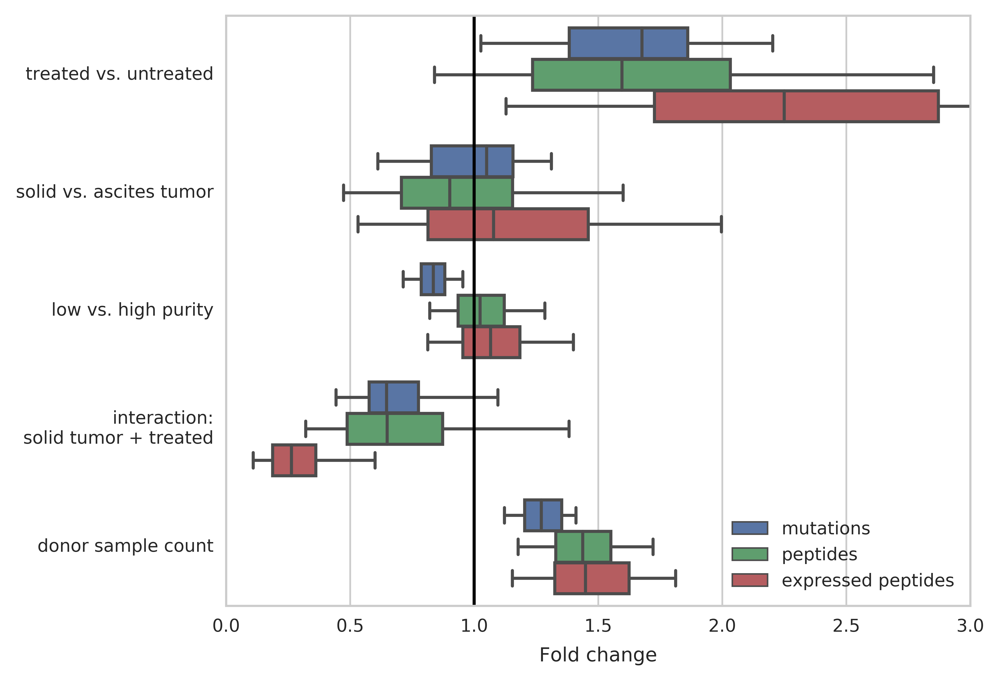

In [10]:
nice_melted = melted.copy()
nice_melted.variable = nice_melted.variable.map(lambda x: {
        "low_cellularity": "low purity",
        "num_sources_for_donor": "donor sample count"
}.get(x, x))
renames = {
    'treated': 'treated vs. untreated',
    'solid': 'solid vs. ascites tumor',
    'low purity': 'low vs. high purity',
    'solid and treated': 'interaction:\nsolid tumor + treated',
    'donor sample count': 'donor sample count',
}
nice_melted.variable = nice_melted.variable.map(renames)

seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted,
    y='variable',
    x='value',
    hue='y_label',
    order=[renames.get(x, x) for x in ["treated", "solid", "low purity", "solid and treated", "donor sample count"]],
    hue_order=["mutations", "peptides", "expressed peptides"],
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=3)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()
pyplot.savefig("../figures/bayesian_model_effects.pdf")

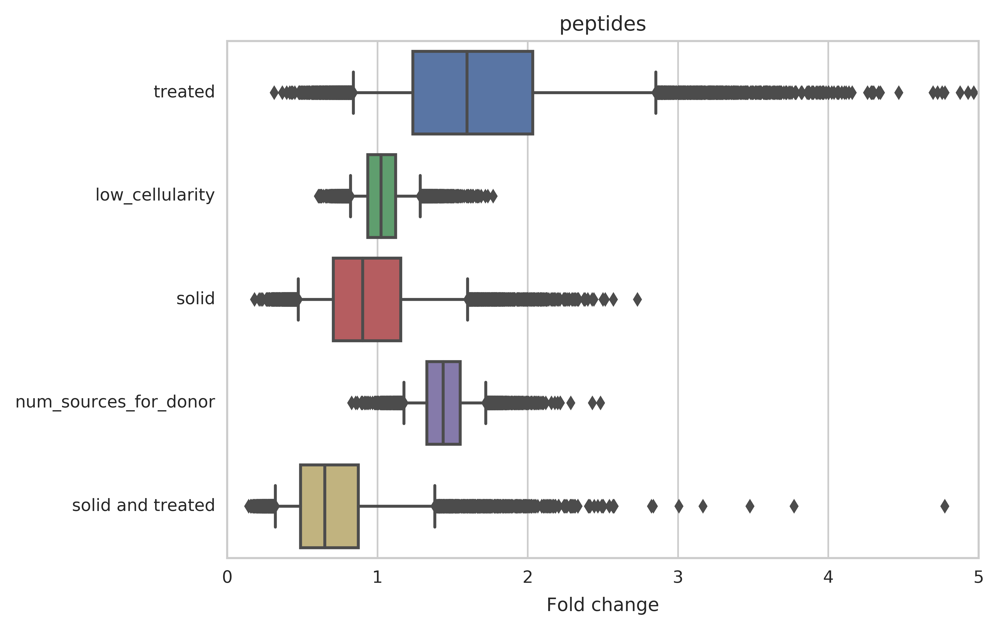

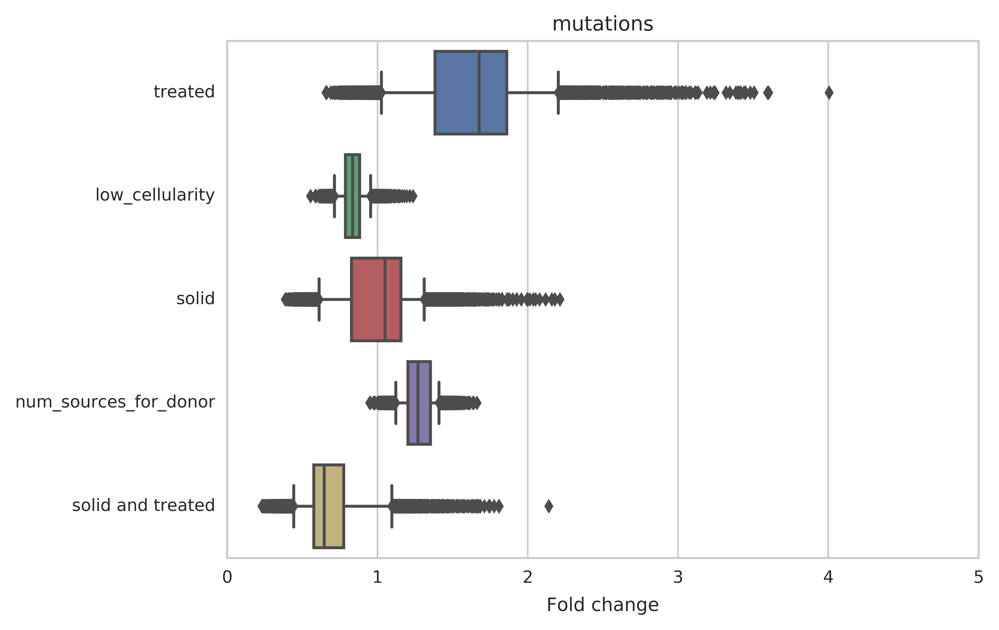

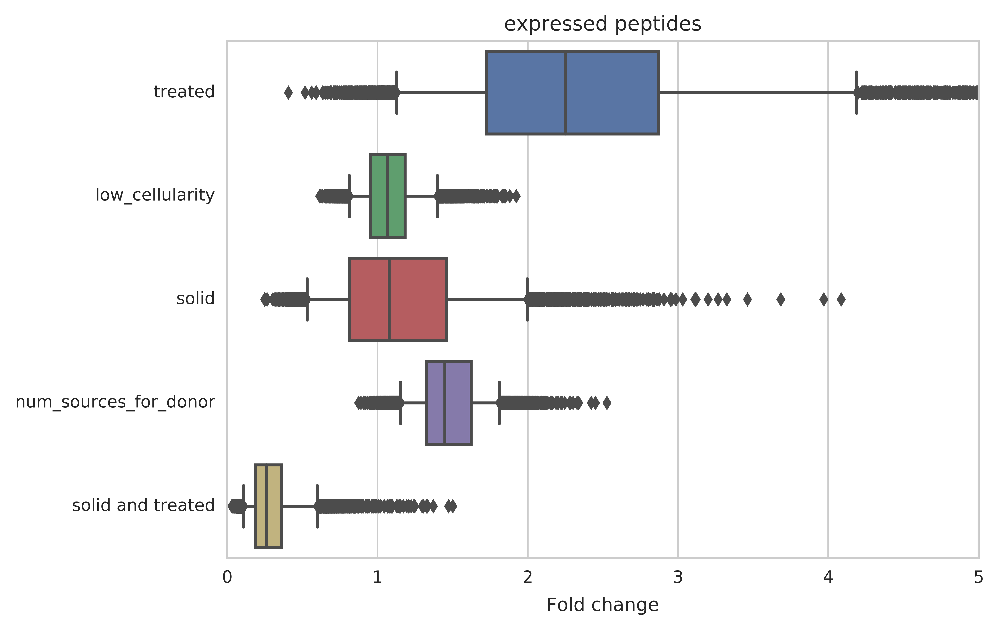

In [11]:
for y_label in fit_results:
    pyplot.figure()
    pyplot.title(y_label)
    seaborn.boxplot(
        data=all_fit_coefficients[all_fit_coefficients.y_label == y_label],
        orient="h",
        whis=[5, 95])

    pyplot.xlabel("Fold change")
    pyplot.xlim(xmin=0, xmax=5)


In [12]:
for y_label in fit_results:
    print(y_label)
    print(all_fit_coefficients[all_fit_coefficients.y_label == y_label].quantile(0.5))
    print("--")

    print(all_fit_coefficients[all_fit_coefficients.y_label == y_label].quantile(0.05))
    print(all_fit_coefficients[all_fit_coefficients.y_label == y_label].quantile(0.95))
    print("")

peptides
treated                  1.596160
low_cellularity          1.023945
solid                    0.902307
num_sources_for_donor    1.437637
solid and treated        0.649505
dtype: float64
--
treated                  0.840701
low_cellularity          0.821014
solid                    0.474123
num_sources_for_donor    1.177410
solid and treated        0.320998
dtype: float64
treated                  2.852166
low_cellularity          1.285383
solid                    1.600675
num_sources_for_donor    1.721171
solid and treated        1.382778
dtype: float64

mutations
treated                  1.676684
low_cellularity          0.835891
solid                    1.050210
num_sources_for_donor    1.270552
solid and treated        0.646946
dtype: float64
--
treated                  1.027213
low_cellularity          0.714275
solid                    0.611959
num_sources_for_donor    1.122137
solid and treated        0.443580
dtype: float64
treated                  2.204054
low_cellularity

In [13]:
numpy.exp(extracted["donor_mean"]).mean()

33.86123634688559

/usr/local/lib/python2.7/dist-packages/seaborn/categorical.py:2342: UserWarning: The violinplot API has been changed. Attempting to adjust your arguments for the new API (which might not work). Please update your code. See the version 0.6 release notes for more info.
  warnings.warn(msg, UserWarning)


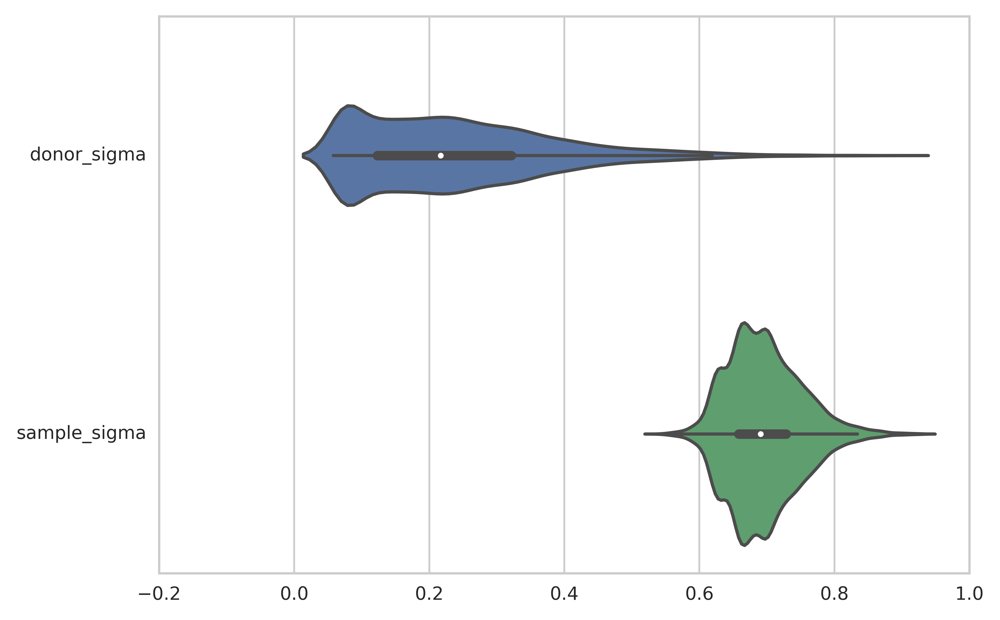

In [14]:
fit_scalars = pandas.DataFrame(
    dict((field, extracted[field])
         for field in ["donor_sigma", "sample_sigma"]))
seaborn.violinplot(fit_scalars, orient="h")

### Posterior predictive checking

#### prep data for pp-checks

In [15]:
all_fit_yreps = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    
    # extract & reshape posterior predicted distribution (y-reps)
    fit_yreps = pandas.DataFrame(extracted['y_rep'],
                           columns=data_by_predicted[y_label].index)
    fit_yreps.index.name = 'iter'
    fit_yreps_long = pandas.DataFrame(fit_yreps.stack())
    fit_yreps_long.reset_index(0, inplace = True)
    fit_ppd = fit_yreps_long
    fit_ppd.columns = ['iter','value']
    fit_ppd['variable'] = y_label
    fit_ppd['value_type'] = 'estimated'
    fit_ppd.reset_index(0, inplace = True)
    fit_ppd['y_rep'] = fit_ppd.value
    
    ## prep observed data to append to y_reps
    obs_y = pandas.DataFrame(data_by_predicted[y_label].y)
    obs_y.columns = ['value']
    obs_y = obs_y.reset_index()
    obs_y['variable'] = y_label
    obs_y['value_type'] = 'observed'
    obs_y['iter'] = 0
    obs_y['y_obs'] = obs_y.value
    
    ## append observed & replicated data
    combined_ppd = pandas.DataFrame.append(fit_ppd, obs_y)
    
    ## append to data prepped earlier
    all_fit_yreps.append(combined_ppd)

all_fit_yreps = pandas.concat(all_fit_yreps, ignore_index=True)
all_fit_yreps.index = all_fit_yreps.source_id
all_fit_yreps = all_fit_yreps.drop('source_id', axis = 1)
all_fit_yreps.head()

,iter,value,value_type,variable,y_obs,y_rep
source_id,,,,,,
AOCS-001-1/SP101515,0,5.033181,estimated,peptides,NaN,5.033181
AOCS-002-1/SP101517,0,5.140067,estimated,peptides,NaN,5.140067
AOCS-004-1/SP101519,0,4.200321,estimated,peptides,NaN,4.200321
AOCS-005-1/SP101521,0,5.417264,estimated,peptides,NaN,5.417264
AOCS-034-13/SP101524,0,5.556085,estimated,peptides,NaN,5.556085


In [16]:
clin_data = data_by_predicted['mutations'].drop('y',axis = 1)
#clin_data.reset_index(0, inplace = True)
clin_data.head()

,donor,treated,low_cellularity,solid,num_sources_for_donor,solid and treated
source_id,,,,,,
AOCS-001-1/SP101515,0,False,True,True,1,False
AOCS-002-1/SP101517,1,False,False,True,1,False
AOCS-004-1/SP101519,2,False,True,True,1,False
AOCS-005-1/SP101521,3,False,False,True,1,False
AOCS-034-13/SP101524,4,True,False,False,2,False


In [17]:
plot_ppd = clin_data.join(all_fit_yreps)
plot_ppd = plot_ppd.reset_index()
plot_ppd['value_type'] = plot_ppd['value_type'].astype('category')
plot_ppd['variable'] = plot_ppd['variable'].astype('category')
plot_ppd.head()


,source_id,donor,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,iter,value,value_type,variable,y_obs,y_rep
0,AOCS-001-1/SP101515,0,False,True,True,1,False,0,5.033181,estimated,peptides,NaN,5.033181
1,AOCS-001-1/SP101515,0,False,True,True,1,False,1,5.127014,estimated,peptides,NaN,5.127014
2,AOCS-001-1/SP101515,0,False,True,True,1,False,2,4.806319,estimated,peptides,NaN,4.806319
3,AOCS-001-1/SP101515,0,False,True,True,1,False,3,5.306929,estimated,peptides,NaN,5.306929
4,AOCS-001-1/SP101515,0,False,True,True,1,False,4,5.488138,estimated,peptides,NaN,5.488138


#### pp-checks overall

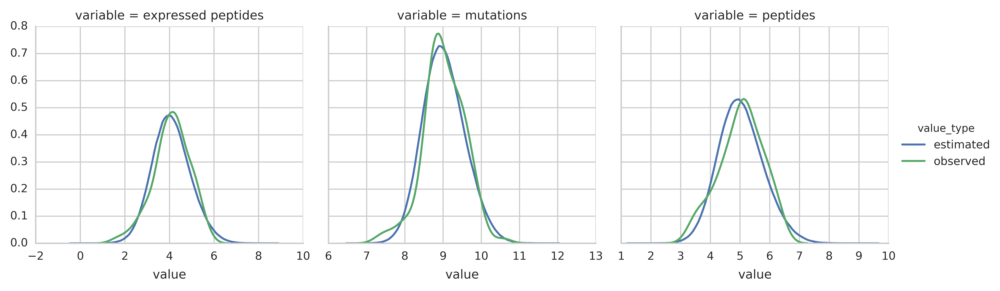

In [18]:
## plot posterior predictive checks, including all iterations
g = seaborn.FacetGrid(plot_ppd, col="variable", hue='value_type', sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


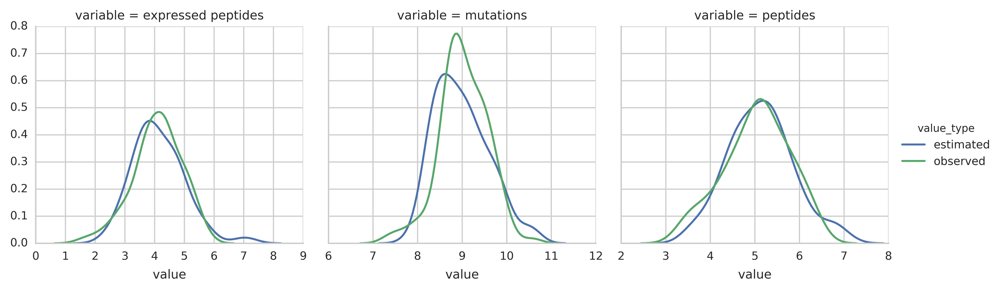

In [19]:
## plot posterior predictive checks, showing draw from a single random iteration
## (would ideally show several iterations in blue & overlay observed iteration in green, but .. alas.
##   .. for that, my seaborn/matplotlib skills would need to improve!)
def select_random_iter(data):
    return data.query('iter == {0} or value_type == "observed"'.format(
            numpy.random.choice(range(1,plot_ppd.iter.max()), 1)
        ))
    
g = seaborn.FacetGrid(
    data=select_random_iter(plot_ppd), 
    col="variable", 
    hue="value_type", 
    sharex=False,
    )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

#### pp-checks comparing solid vs ascites

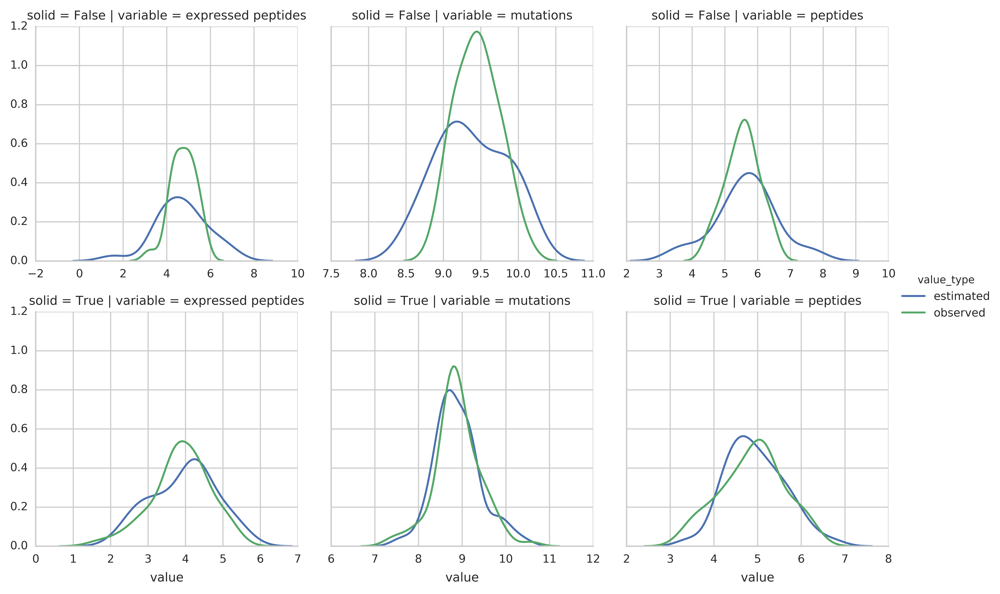

In [20]:
## plot by solid vs ascites
g = seaborn.FacetGrid(select_random_iter(plot_ppd),
                      col="variable",
                      row="solid", 
                      hue="value_type", 
                      sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


In [21]:
## Based on the above, might hypothesize that ascites & solid samples might 
## have different amounts of variation in observed data

## we can check this by computing, for each iteration, the MINIMUM value observed 
## ideally, this will be similar for replicated & observed data 
## restrict to "mutations" data since this is the first source of observed data

## we will want to compute this overall, and also for ascites & solid tumors separately
## here, compute by ascites/solid first since this can be summarized into an overall min
grouped_muttype = plot_ppd.query("variable == 'mutations'").groupby(['iter','solid'])
grouped_muttype_min = grouped_muttype.aggregate(numpy.min).reset_index()
grouped_muttype_min['min_value'] = grouped_muttype_min.y_rep
grouped_muttype_min.head()


,iter,solid,donor,low_cellularity,num_sources_for_donor,solid and treated,source_id,treated,value,y_obs,y_rep,min_value
0,0,False,4,False,1,False,AOCS-034-13/SP101524,False,8.912339,8.912339,8.928111,8.928111
1,0,True,0,False,1,False,AOCS-001-1/SP101515,False,7.334329,7.334329,7.512707,7.512707
2,1,False,4,False,1,False,AOCS-034-13/SP101524,False,8.359708,NaN,8.359708,8.359708
3,1,True,0,False,1,False,AOCS-001-1/SP101515,False,7.860149,NaN,7.860149,7.860149
4,2,False,4,False,1,False,AOCS-034-13/SP101524,False,8.680244,NaN,8.680244,8.680244


In [22]:
## now, aggregate by-ascites-vs-solid into overall
grouped_mut_min = grouped_muttype_min.groupby(['iter'])
grouped_mut_min = grouped_mut_min.aggregate(numpy.min).reset_index()
grouped_mut_min['min_value'] = grouped_mut_min.y_rep
grouped_mut_min.head()

,iter,solid,donor,low_cellularity,num_sources_for_donor,solid and treated,source_id,treated,value,y_obs,y_rep,min_value
0,0,False,0,False,1,False,AOCS-001-1/SP101515,False,7.334329,7.334329,7.512707,7.512707
1,1,False,0,False,1,False,AOCS-001-1/SP101515,False,7.860149,NaN,7.860149,7.860149
2,2,False,0,False,1,False,AOCS-001-1/SP101515,False,7.963675,NaN,7.963675,7.963675
3,3,False,0,False,1,False,AOCS-001-1/SP101515,False,6.910082,NaN,6.910082,6.910082
4,4,False,0,False,1,False,AOCS-001-1/SP101515,False,7.500843,NaN,7.500843,7.500843


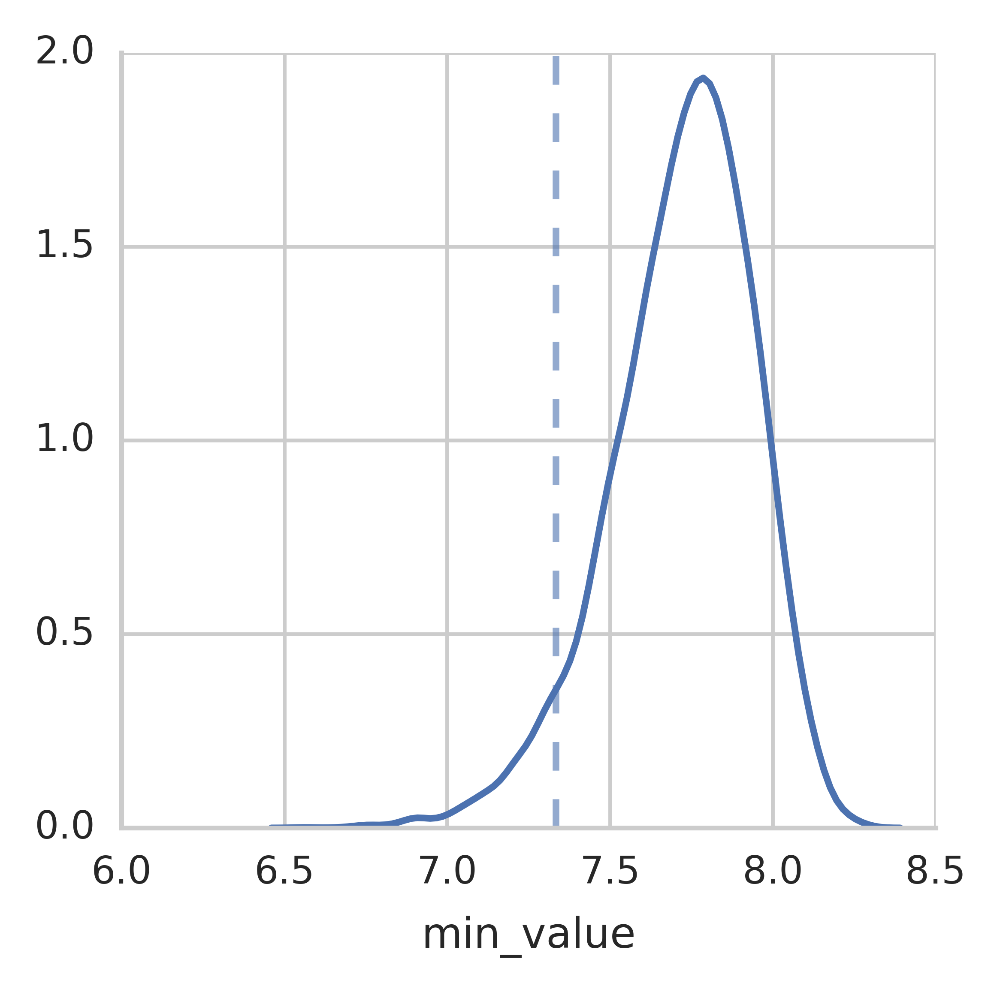

In [23]:
## how close is estimated minimum to the observed minimum?
g = seaborn.FacetGrid(data = grouped_mut_min)
g.map(pyplot.axvline, "y_obs", linestyle = 'dashed', alpha = 0.6)
g.map(seaborn.distplot, "min_value", hist = False)


In [24]:
## how likely are we to have seen a minimum value this extreme?
## this is equal to the proportion of iterations with a value <= the observed min
observed_min = grouped_mut_min.y_obs.min()
prop = numpy.mean(grouped_mut_min.min_value <= observed_min)
min(prop, 1-prop)

0.0557

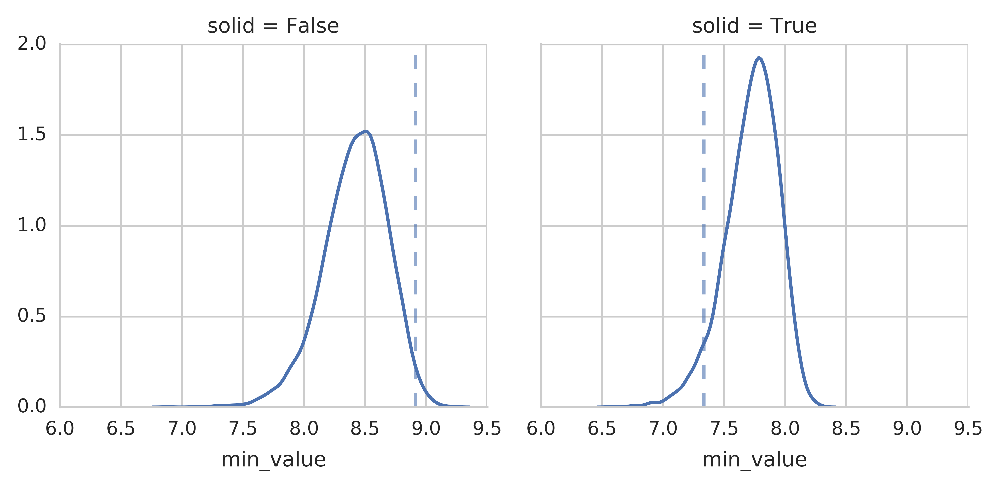

In [25]:
## now, let's repeat by ascites/solid 
g = seaborn.FacetGrid(data = grouped_muttype_min, col = 'solid')
g.map(pyplot.axvline, "y_obs", linestyle = 'dashed', alpha = 0.6)
g.map(seaborn.distplot, "min_value", hist = False)


In [26]:
## how likely are we to have seen a minimum value this extreme?
## this is equal to the proportion of iterations with a value <= the observed min
observed_mins = grouped_muttype_min.groupby('solid').aggregate(numpy.min).rename(columns = {"y_obs": "observed_min"}).observed_min 
prop_below_observed = grouped_muttype_min.set_index('solid').join(observed_mins)
prop_below_observed = prop_below_observed.rename(columns = {'min_value':'estimated_min'})
prop_below_observed = prop_below_observed.reset_index()
prop_below_observed.head()

,solid,iter,donor,low_cellularity,num_sources_for_donor,solid and treated,source_id,treated,value,y_obs,y_rep,estimated_min,observed_min
0,False,0,4,False,1,False,AOCS-034-13/SP101524,False,8.912339,8.912339,8.928111,8.928111,8.912339
1,False,1,4,False,1,False,AOCS-034-13/SP101524,False,8.359708,NaN,8.359708,8.359708,8.912339
2,False,2,4,False,1,False,AOCS-034-13/SP101524,False,8.680244,NaN,8.680244,8.680244,8.912339
3,False,3,4,False,1,False,AOCS-034-13/SP101524,False,8.413677,NaN,8.413677,8.413677,8.912339
4,False,4,4,False,1,False,AOCS-034-13/SP101524,False,8.472031,NaN,8.472031,8.472031,8.912339


In [27]:
def below_observed(row):
    if row.estimated_min < row.observed_min:
        return 1
    else:
        return 0

prop_below_observed['below_observed'] = prop_below_observed.apply(lambda row: below_observed(row), axis = 1)
prop_below_observed.head()

,solid,iter,donor,low_cellularity,num_sources_for_donor,solid and treated,source_id,treated,value,y_obs,y_rep,estimated_min,observed_min,below_observed
0,False,0,4,False,1,False,AOCS-034-13/SP101524,False,8.912339,8.912339,8.928111,8.928111,8.912339,0
1,False,1,4,False,1,False,AOCS-034-13/SP101524,False,8.359708,NaN,8.359708,8.359708,8.912339,1
2,False,2,4,False,1,False,AOCS-034-13/SP101524,False,8.680244,NaN,8.680244,8.680244,8.912339,1
3,False,3,4,False,1,False,AOCS-034-13/SP101524,False,8.413677,NaN,8.413677,8.413677,8.912339,1
4,False,4,4,False,1,False,AOCS-034-13/SP101524,False,8.472031,NaN,8.472031,8.472031,8.912339,1


In [28]:
## proportion of observations below / above observed min
 

prop = prop_below_observed.groupby('solid').agg(lambda x: min(numpy.mean(x), numpy.mean(1-x))).below_observed
prop

solid
False    0.0161
True     0.0547
Name: below_observed, dtype: float64

#### pp-checks by number of sources

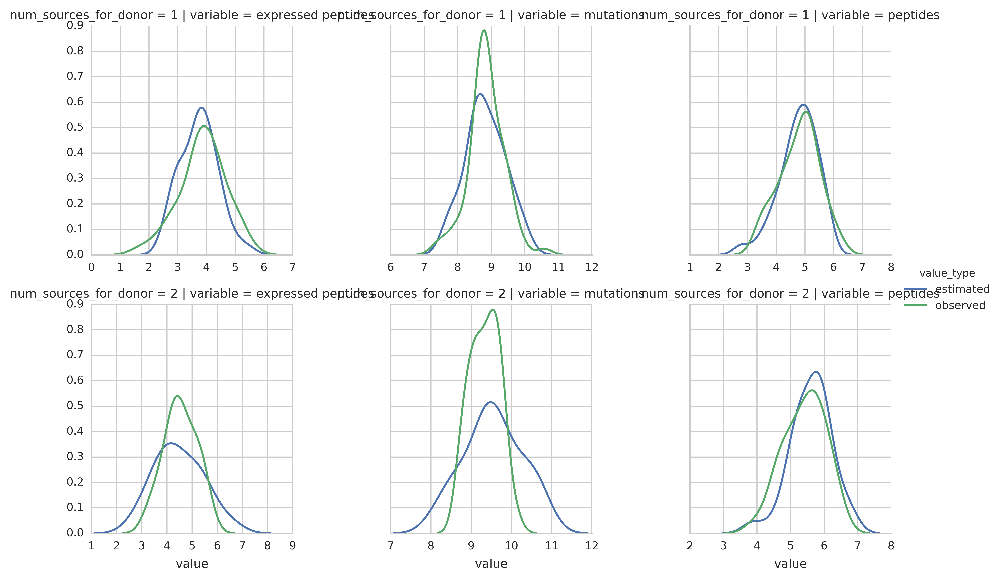

In [72]:
## plot by number of sources
g = seaborn.FacetGrid(select_random_iter(plot_ppd.query('num_sources_for_donor <= 2')),
                      col="variable",
                      row="num_sources_for_donor", 
                      hue="value_type",
                      sharex=False,
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

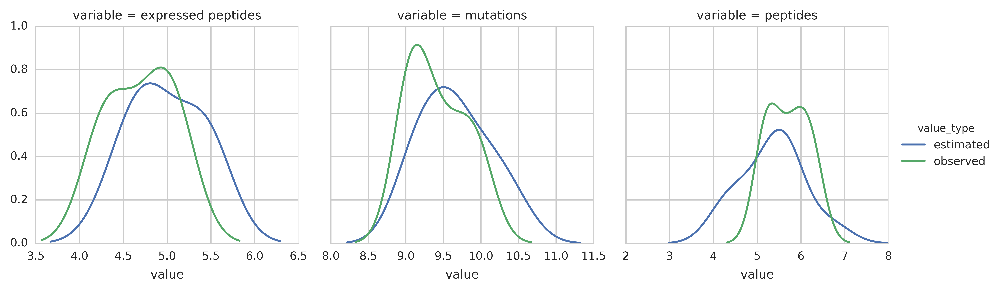

In [30]:
## plot among donors with 3-4 sources per donor
g = seaborn.FacetGrid(select_random_iter(plot_ppd.query('num_sources_for_donor > 2')),
                      col="variable",
                      hue="value_type", 
                      sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

#### pp-checks by treated vs untreated

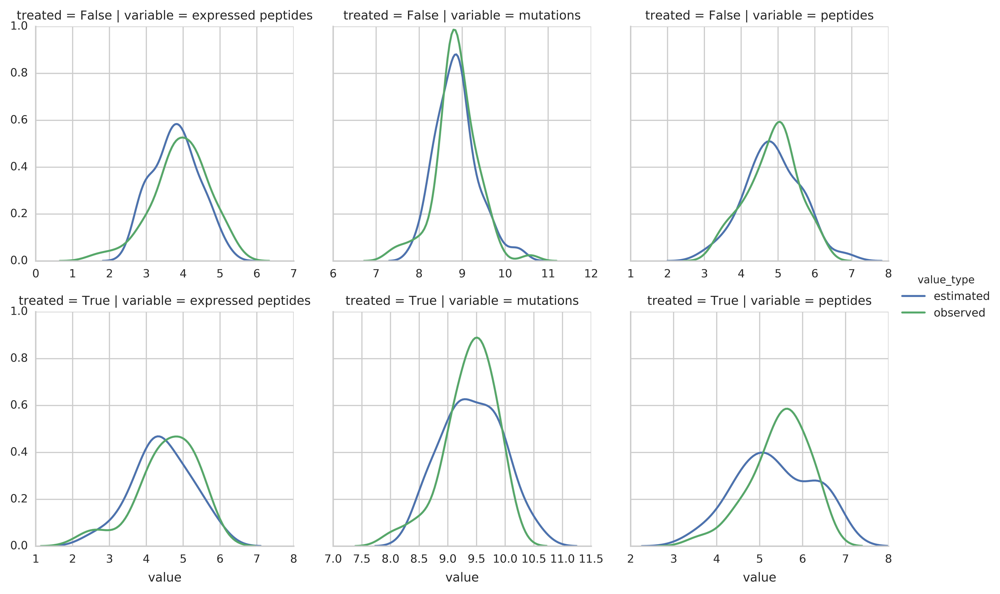

In [31]:
## plot by treated / untreated
g = seaborn.FacetGrid(select_random_iter(plot_ppd), 
                      col="variable", 
                      row='treated',
                      hue="value_type",
                      sharex=False,
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

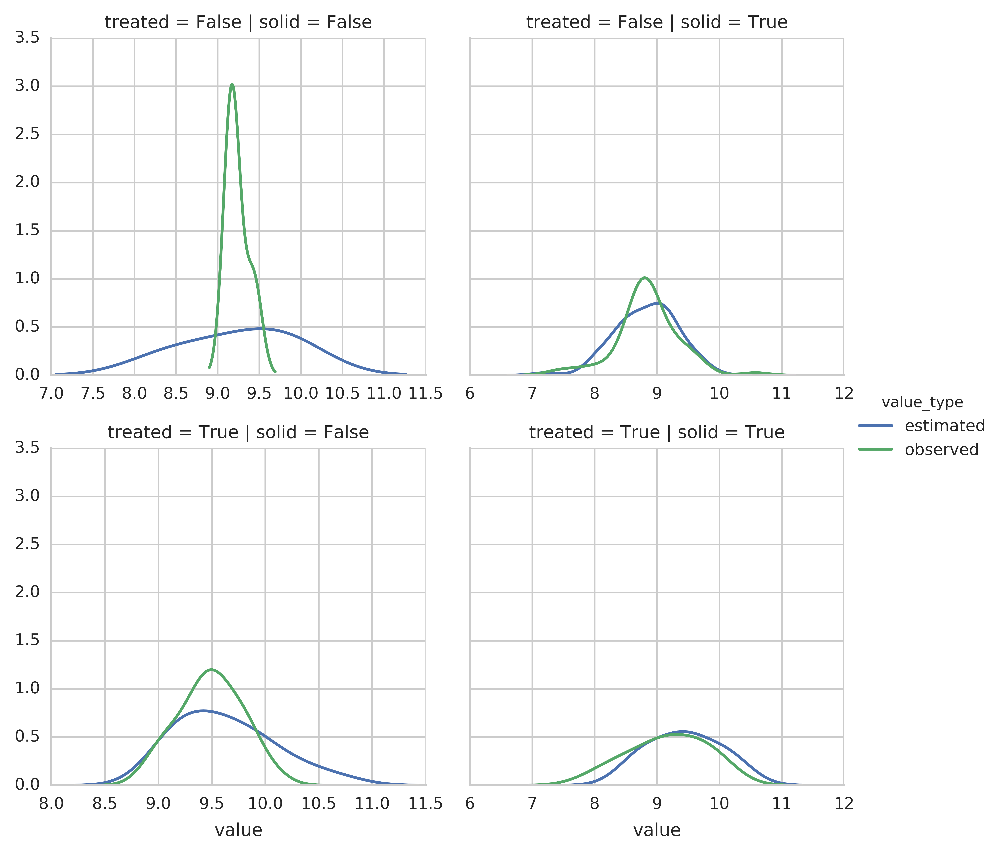

In [32]:
## plot by treated / untreated by solid/ascites, looking only at number of mutations
## granted, we know some of these have small sample sizes .. 
g = seaborn.FacetGrid(select_random_iter(plot_ppd.query('variable == "mutations"')), 
                      col="solid", 
                      row='treated',
                      hue="value_type",
                      sharex=False,
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

#### pp-checks by source_id, among donors with many samples

In [33]:
tempd = plot_ppd.query('variable == "mutations" and num_sources_for_donor > 2')

In [34]:
g = seaborn.FacetGrid(data = tempd.sort_values(by = ['donor','treated']),
                      col = 'source_id', col_wrap = 6,
                      sharex = False, hue = 'treated'
                     )
g.map(seaborn.distplot, "y_rep", hist = False)
g.map(pyplot.axvline, "y_obs", alpha = 0.8, linestyle='dashed')
g.add_legend()

#### pp-check on distribution of donor means

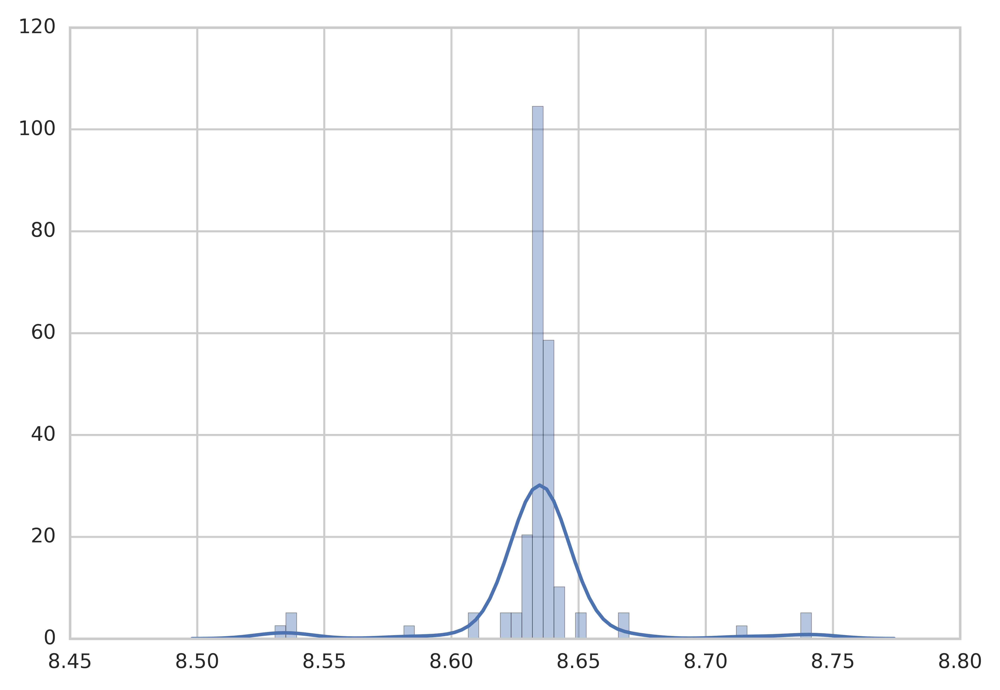

In [35]:
seaborn.distplot(fit_results['mutations'].extract()['donor_mean'].mean(0))

In [36]:
y_label = 'mutations'
fit = fit_results[y_label]

In [37]:
fit_res = pandas.DataFrame(extracted['donor_mean'])
fit_res.index.name = 'iter'
fit_res = pandas.DataFrame(fit_res.stack())
fit_res.reset_index(0, inplace = True)
fit_res.columns = ['iter','value']
fit_res['variable'] = y_label
fit_res['value_type'] = 'estimated_donor_mean'
fit_res.reset_index(0, inplace = True)
fit_res.index.name = 'donor'
fit_res.head()

,index,iter,value,variable,value_type
donor,,,,,
0,0,0,3.685942,mutations,estimated_donor_mean
1,1,0,3.365624,mutations,estimated_donor_mean
2,2,0,3.416967,mutations,estimated_donor_mean
3,3,0,3.636717,mutations,estimated_donor_mean
4,4,0,3.937442,mutations,estimated_donor_mean


In [38]:
## prep data 
all_donor_means = []
for (y_label, fit) in fit_results.items():
    extracted = fit.extract()
    
    # extract & reshape posterior predicted distribution (y-reps)
    fit_res = pandas.DataFrame(extracted['donor_mean'])
    fit_res.index.name = 'iter'
    fit_res = pandas.DataFrame(fit_res.stack())
    fit_res.reset_index(0, inplace = True)
    fit_res.columns = ['iter','value']
    fit_res['variable'] = y_label
    fit_res['value_type'] = 'estimated donor mean'
    fit_res.reset_index(0, inplace = True)
    fit_res.index.name = 'donor'
    fit_res.reset_index(0, inplace = True)
    
    ## append to data prepped earlier
    all_donor_means.append(fit_res)

all_donor_means = pandas.concat(all_donor_means, ignore_index=True)
#all_donor_means.index = all_donor_means.donor
#all_donor_means = all_donor_means.drop('source_id', axis = 1)
all_donor_means = all_donor_means.drop('donor', axis = 1).rename(columns = {'index': 'donor'})
all_donor_means = all_donor_means.set_index('donor')
all_donor_means.head()

,iter,value,variable,value_type
donor,,,,
0,0,4.936297,peptides,estimated donor mean
1,0,4.793484,peptides,estimated donor mean
2,0,5.180103,peptides,estimated donor mean
3,0,4.680653,peptides,estimated donor mean
4,0,4.800027,peptides,estimated donor mean


In [39]:
## join with clinical data

clin_data_donors = clin_data.groupby('donor').max()
clin_data_donors['multiple_sources'] = clin_data_donors.num_sources_for_donor > 1
clin_data_donors['several_sources'] = clin_data_donors.num_sources_for_donor > 2
clin_data_donors.head()


,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,multiple_sources,several_sources
donor,,,,,,,
0,False,True,True,1,False,False,False
1,False,False,True,1,False,False,False
2,False,True,True,1,False,False,False
3,False,False,True,1,False,False,False
4,True,False,True,2,False,True,False


In [40]:
donor_ppd_data = all_donor_means.join(clin_data_donors)
donor_ppd_data.head()

,iter,value,variable,value_type,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,multiple_sources,several_sources
donor,,,,,,,,,,,
0,0,4.936297,peptides,estimated donor mean,False,True,True,1,False,False,False
0,1,4.240075,peptides,estimated donor mean,False,True,True,1,False,False,False
0,2,6.213336,peptides,estimated donor mean,False,True,True,1,False,False,False
0,3,5.835286,peptides,estimated donor mean,False,True,True,1,False,False,False
0,4,4.266654,peptides,estimated donor mean,False,True,True,1,False,False,False


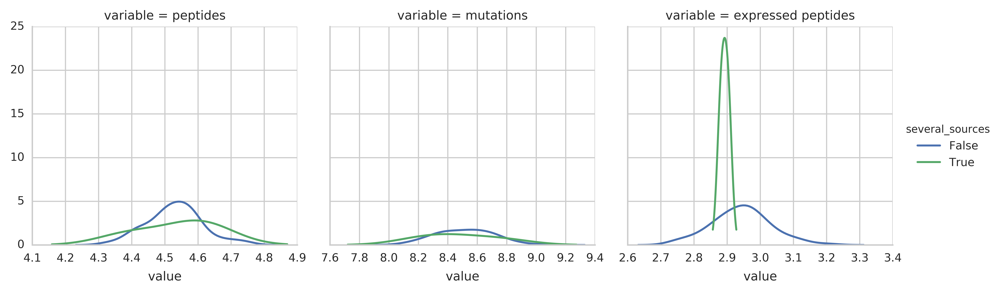

In [41]:
g = seaborn.FacetGrid(data = select_random_iter(donor_ppd_data),
                      hue = 'several_sources',
                      col = 'variable',
                      sharex = False
                     )
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()

### modified model code to test sensitivity to variance 

In [42]:
# stan model
model2 = """
data {
    // Data sizes
    int<lower=0> num_sources;
    int<lower=0> num_predictors;
    int<lower=0> num_donors;

    // Data
    vector[num_predictors] predictors[num_sources];
    int<lower=0> donors[num_sources];
    real y[num_sources];  // predicted variable
    int<lower=1> num_sources_for_donor[num_sources];
    int<lower=0, upper=1> solid[num_sources];
}
parameters {
    real global_mean;
    real<lower=0> donor_sigma;
    real<lower=0> solid_sigma;
    real<lower=0> ascites_sigma;
    real<lower=0> sample_sigma;
    vector[num_donors] donor_mean;
    vector[num_predictors] predictor_coefficients;
}
transformed parameters {
    real lp;
    real mu[num_sources];
    
    for (i in 1:num_sources) {
        lp <- dot_product(predictors[i], predictor_coefficients);
        if (num_sources_for_donor[i] > 1) {
            mu[i] <- donor_mean[donors[i]] + lp;
        } else {
            mu[i] <- global_mean + lp;
        }
    }
}
model {
    global_mean ~ normal(0, 100);
    donor_sigma ~ cauchy(0, 2);
    sample_sigma ~ cauchy(0, 2);
    solid_sigma ~ normal(sample_sigma, 1);
    ascites_sigma ~ normal(sample_sigma, 1);
    donor_mean ~ normal(global_mean, donor_sigma);
    predictor_coefficients ~ normal(0, 20);
    for (i in 1:num_sources) {
        if (solid[i]==1) {
            y[i] ~ normal(mu[i], solid_sigma);
        } else {
            y[i] ~ normal(mu[i], ascites_sigma);
        }
    }
}
generated quantities {
    real y_rep[num_sources];
    real log_lik[num_sources];
    
    for (i in 1:num_sources) {
        if (solid[i]==1) {
            y_rep[i] <- normal_rng(mu[i], solid_sigma);
            log_lik[i] <- normal_log(y[i], mu[i], solid_sigma);
        } else {
            y_rep[i] <- normal_rng(mu[i], ascites_sigma);
            log_lik[i] <- normal_log(y[i], mu[i], solid_sigma);
        }
    }
}
""".strip()

data = {    

}
def init(data):
    return {
        'global_mean': numpy.random.normal(0, .1),
        'donor_sigma': numpy.random.normal(1, .1),
        'sample_sigma': numpy.random.normal(1, .1),
        'solid_sigma': numpy.random.normal(1, .1),
        'ascites_sigma': numpy.random.normal(1, .1),
        'donor_mean': numpy.zeros(data['num_donors']),
        'predictor_coefficients': numpy.random.normal(0, .1, size=(data['num_predictors'],)),
    }

for (i, line) in enumerate(model1.split("\n")):
    print("%3d %s" % (i + 1, line))

def print_dict(d):
    for key in [key for key in d if not isinstance(d[key], numpy.ndarray)]:
        print("%s: %s" % (key, d[key]))
    for key in [key for key in d if isinstance(d[key], numpy.ndarray)]:
        print("%s: %s mean=%s std=%s" % (key,  d[key].shape, d[key].mean(), d[key].std()))

fit_results2 = {}
for (y_label, raw_data) in data_by_predicted.items():
    print("+" * 40)
    print("RUNNING MODEL FOR: %s" % y_label)
    df_x = raw_data[[x for x in list(raw_data.columns) if x not in ("y", "donor")]].astype(float)
    data = {
        'num_sources': len(raw_data.index),
        'num_predictors': len(df_x.columns),
        'num_donors': raw_data.donor.nunique(),

        'predictors': df_x.values.astype(float),
        'donors': raw_data.donor.values + 1,  # convert to 1-indexed
        'num_sources_for_donor': raw_data.num_sources_for_donor.values,
        'solid': raw_data.solid.values.astype(int),
        'y': raw_data.y.values,
    }
    print("")
    print("*" * 40)
    print("DATA")
    print_dict(data)
    print("")

    print("*" * 40)
    print("INITIAL VALUES")
    print_dict(init(data))
    sys.stdout.flush()
    
    fit_results2[y_label] = stanity.fit(model_code=model2, data=data, init=lambda: init(data), iter=10000, chains=2)
    print("Done with fit.")
print("DONE")


  1 data {
  2     // Data sizes
  3     int<lower=0> num_sources;
  4     int<lower=0> num_predictors;
  5     int<lower=0> num_donors;
  6 
  7     // Data
  8     vector[num_predictors] predictors[num_sources];
  9     int<lower=0> donors[num_sources];
 10     real y[num_sources];  // predicted variable
 11     int<lower=1> num_sources_for_donor[num_sources];
 12 }
 13 parameters {
 14     real global_mean;
 15     real<lower=0> donor_sigma;
 16     real<lower=0> sample_sigma;
 17     vector[num_donors] donor_mean;    
 18     vector[num_predictors] predictor_coefficients;
 19 }
 20 transformed parameters {
 21     real lp;
 22     real mu[num_sources];
 23     
 24     for (i in 1:num_sources) {
 25         lp <- dot_product(predictors[i], predictor_coefficients);
 26         if (num_sources_for_donor[i] > 1) {
 27             mu[i] <- donor_mean[donors[i]] + lp;
 28         } else {
 29             mu[i] <- global_mean + lp;
 30         }
 31     }
 32 }
 33 model {
 34     global

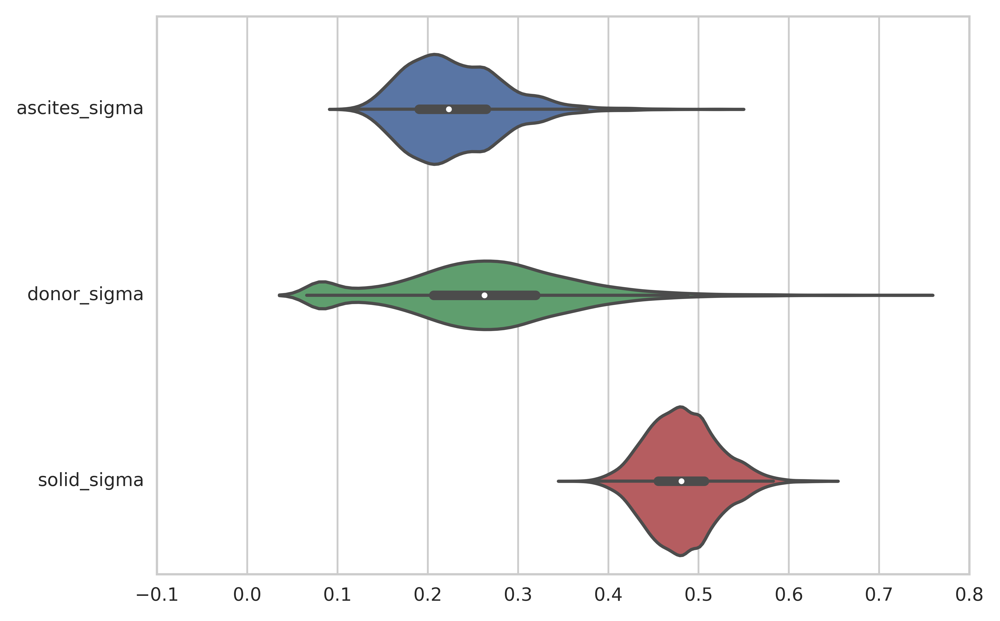

In [43]:
## inspect solid & ascites sigma values
extracted = fit_results2['mutations']
fit_scalars = pandas.DataFrame(
    dict((field, extracted[field])
         for field in ["donor_sigma", "solid_sigma", "ascites_sigma"]))
seaborn.violinplot(fit_scalars, orient="h")

#### check coefficient estimates using this model

In [44]:
all_fit_coefficients2 = []
for (y_label, fit) in fit_results2.items():
    extracted = fit.extract()
    fit_coefficients = pandas.DataFrame(numpy.exp(extracted['predictor_coefficients']),
                           columns=list(data_by_predicted[y_label].columns)[2:])
    fit_coefficients["y_label"] = y_label
    all_fit_coefficients2.append(fit_coefficients)
all_fit_coefficients2 = pandas.concat(all_fit_coefficients2, ignore_index=True)
all_fit_coefficients2.head()

,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,y_label
0,0.896341,1.218362,0.463116,1.175261,0.908593,peptides
1,1.709785,1.115616,0.879176,1.273415,0.775103,peptides
2,1.218066,1.214712,0.517622,1.146778,1.154308,peptides
3,1.606894,1.043588,1.110911,1.383721,0.582945,peptides
4,2.347625,1.215912,1.570636,2.026039,0.364441,peptides


In [45]:
melted2 = pandas.melt(all_fit_coefficients2, id_vars=["y_label"])

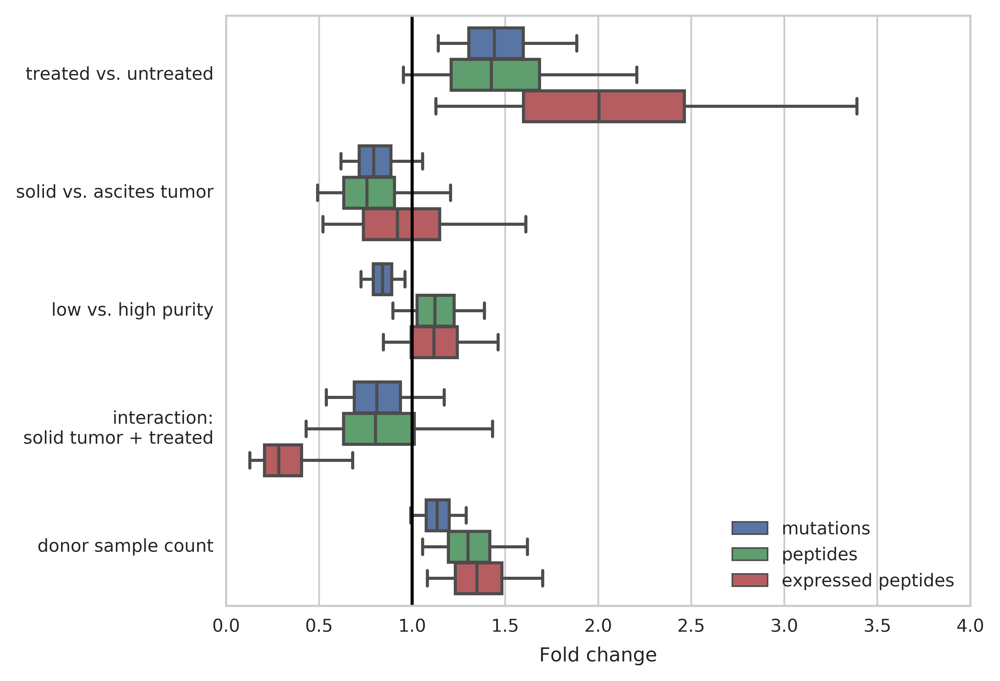

In [46]:
nice_melted2 = melted2.copy()
nice_melted2.variable = nice_melted2.variable.map(lambda x: {
        "low_cellularity": "low purity",
        "num_sources_for_donor": "donor sample count"
}.get(x, x))
renames = {
    'treated': 'treated vs. untreated',
    'solid': 'solid vs. ascites tumor',
    'low purity': 'low vs. high purity',
    'solid and treated': 'interaction:\nsolid tumor + treated',
    'donor sample count': 'donor sample count',
}
nice_melted2.variable = nice_melted2.variable.map(renames)

seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted2,
    y='variable',
    x='value',
    hue='y_label',
    order=[renames.get(x, x) for x in ["treated", "solid", "low purity", "solid and treated", "donor sample count"]],
    hue_order=["mutations", "peptides", "expressed peptides"],
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=4)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()
#pyplot.savefig("../figures/bayesian_model_effects.pdf")

In [47]:
## compare coefficient estimates under m1 & m2
nice_melted['model'] = 'model1'
nice_melted2['model'] = 'model2'
nice_melted_compare = pandas.concat([nice_melted, nice_melted2])
nice_melted_compare.head()

,y_label,variable,value,model
0,peptides,treated vs. untreated,0.930375,model1
1,peptides,treated vs. untreated,1.414997,model1
2,peptides,treated vs. untreated,0.950636,model1
3,peptides,treated vs. untreated,1.116694,model1
4,peptides,treated vs. untreated,2.098219,model1


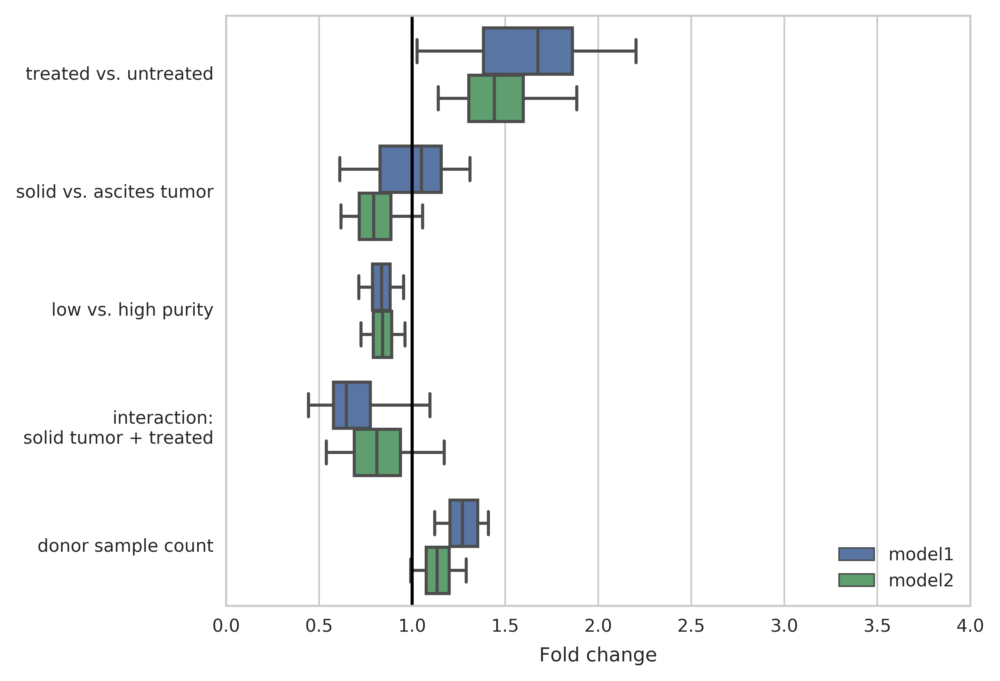

In [48]:
## mutation count
seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted_compare.query('y_label == "mutations"'),
    y='variable',
    x='value',
    hue='model',
    order=[renames.get(x, x) for x in ["treated", "solid", "low purity", "solid and treated", "donor sample count"]],
    hue_order=["model1", "model2"],
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=4)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()

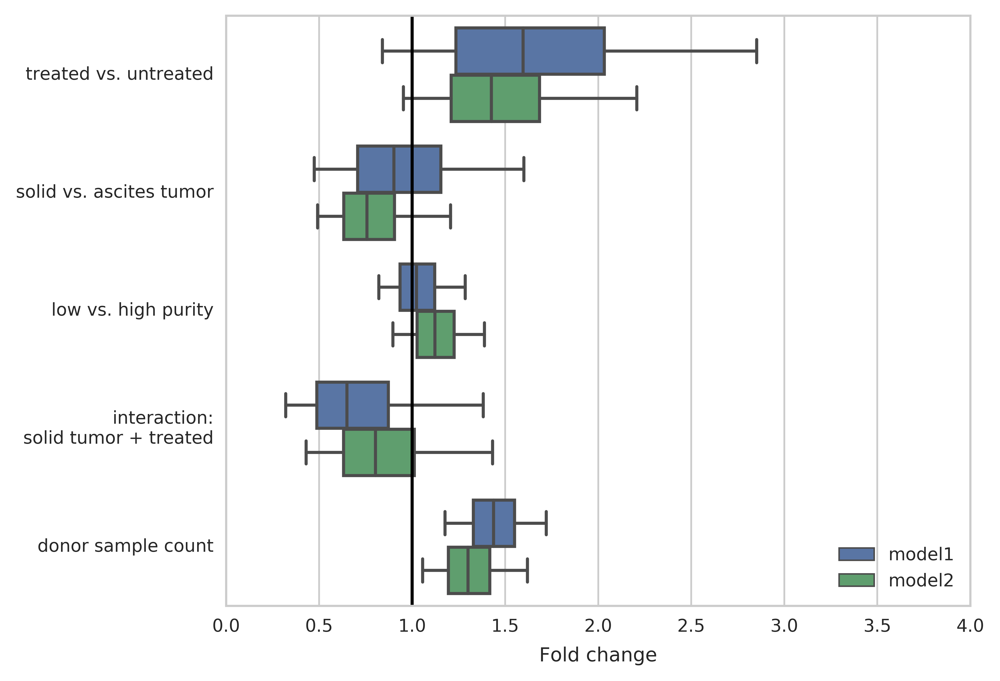

In [49]:
## peptide count
seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted_compare.query('y_label == "peptides"'),
    y='variable',
    x='value',
    hue='model',
    order=[renames.get(x, x) for x in ["treated", "solid", "low purity", "solid and treated", "donor sample count"]],
    hue_order=["model1", "model2"],
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=4)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()

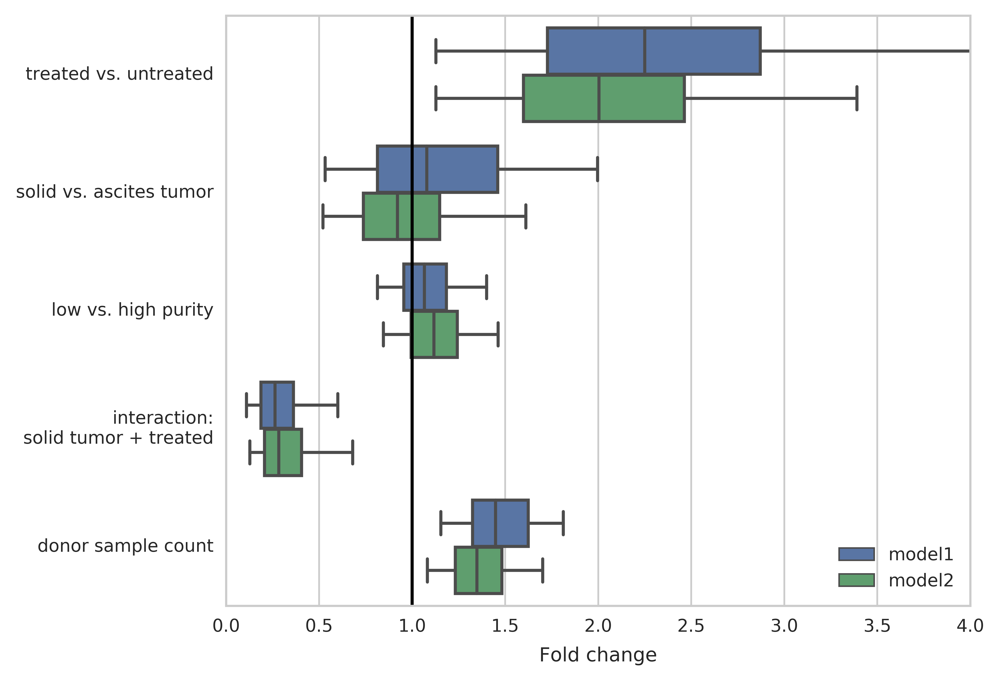

In [50]:
## expressed peptide count
seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted_compare.query('y_label == "expressed peptides"'),
    y='variable',
    x='value',
    hue='model',
    order=[renames.get(x, x) for x in ["treated", "solid", "low purity", "solid and treated", "donor sample count"]],
    hue_order=["model1", "model2"],
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=4)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()

#### revisit PPD checks for sanity

In [51]:
## prep ppd data 
all_fit_yreps2 = []
for (y_label, fit) in fit_results2.items():
    extracted = fit.extract()
    
    # extract & reshape posterior predicted distribution (y-reps)
    fit_yreps = pandas.DataFrame(extracted['y_rep'],
                           columns=data_by_predicted[y_label].index)
    fit_yreps.index.name = 'iter'
    fit_yreps_long = pandas.DataFrame(fit_yreps.stack())
    fit_yreps_long.reset_index(0, inplace = True)
    fit_ppd = fit_yreps_long
    fit_ppd.columns = ['iter','value']
    fit_ppd['variable'] = y_label
    fit_ppd['value_type'] = 'estimated'
    fit_ppd.reset_index(0, inplace = True)
    fit_ppd['y_rep'] = fit_ppd.value
    
    ## prep observed data to append to y_reps
    obs_y = pandas.DataFrame(data_by_predicted[y_label].y)
    obs_y.columns = ['value']
    obs_y = obs_y.reset_index()
    obs_y['variable'] = y_label
    obs_y['value_type'] = 'observed'
    obs_y['iter'] = 0
    obs_y['y_obs'] = obs_y.value
    
    ## append observed & replicated data
    combined_ppd = pandas.DataFrame.append(fit_ppd, obs_y)
    
    ## append to data prepped earlier
    all_fit_yreps2.append(combined_ppd)

all_fit_yreps2 = pandas.concat(all_fit_yreps2, ignore_index=True)
all_fit_yreps2.index = all_fit_yreps2.source_id
all_fit_yreps2 = all_fit_yreps2.drop('source_id', axis = 1)
all_fit_yreps2.head()

,iter,value,value_type,variable,y_obs,y_rep
source_id,,,,,,
AOCS-001-1/SP101515,0,5.228705,estimated,peptides,NaN,5.228705
AOCS-002-1/SP101517,0,4.007266,estimated,peptides,NaN,4.007266
AOCS-004-1/SP101519,0,6.399614,estimated,peptides,NaN,6.399614
AOCS-005-1/SP101521,0,4.879298,estimated,peptides,NaN,4.879298
AOCS-034-13/SP101524,0,5.588092,estimated,peptides,NaN,5.588092


In [52]:
clin_data = data_by_predicted['mutations'].drop('y',axis = 1)
plot_ppd2 = clin_data.join(all_fit_yreps2)
plot_ppd2 = plot_ppd2.reset_index()
plot_ppd2['value_type'] = plot_ppd2['value_type'].astype('category')
plot_ppd2['variable'] = plot_ppd2['variable'].astype('category')
plot_ppd2.head()


,source_id,donor,treated,low_cellularity,solid,num_sources_for_donor,solid and treated,iter,value,value_type,variable,y_obs,y_rep
0,AOCS-001-1/SP101515,0,False,True,True,1,False,0,5.228705,estimated,peptides,NaN,5.228705
1,AOCS-001-1/SP101515,0,False,True,True,1,False,1,4.056383,estimated,peptides,NaN,4.056383
2,AOCS-001-1/SP101515,0,False,True,True,1,False,2,4.702752,estimated,peptides,NaN,4.702752
3,AOCS-001-1/SP101515,0,False,True,True,1,False,3,4.904989,estimated,peptides,NaN,4.904989
4,AOCS-001-1/SP101515,0,False,True,True,1,False,4,4.881628,estimated,peptides,NaN,4.881628


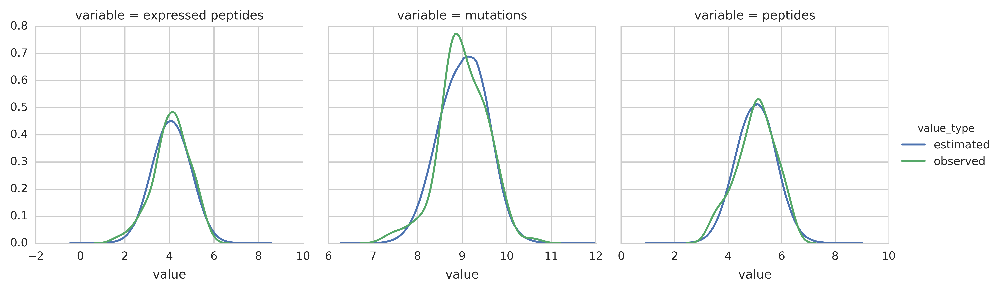

In [53]:
## plot posterior predictive checks, including all iterations
g = seaborn.FacetGrid(plot_ppd2, col="variable", hue='value_type', sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


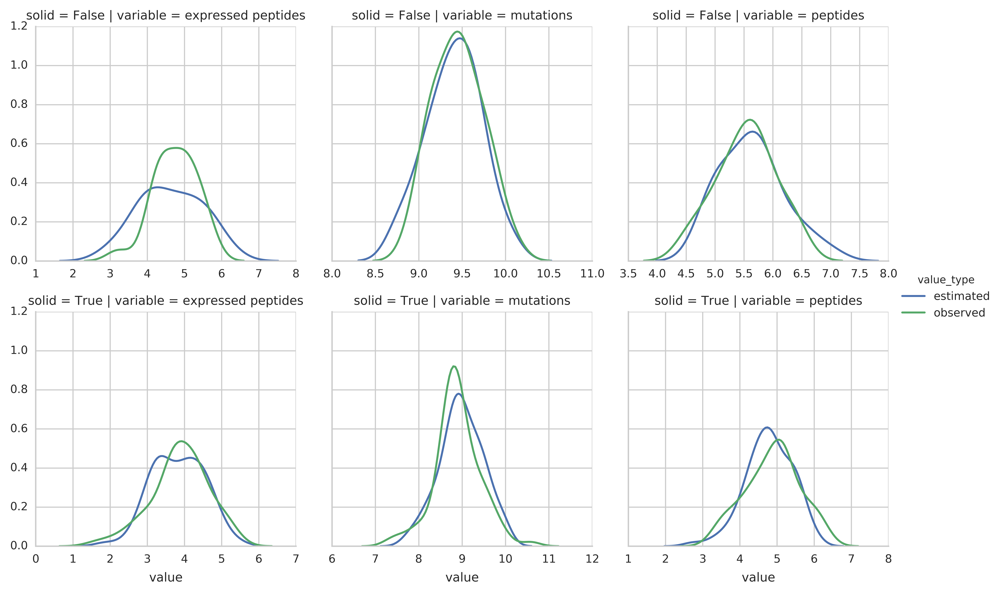

In [54]:
## plot by solid vs ascites
g = seaborn.FacetGrid(select_random_iter(plot_ppd2),
                      col="variable",
                      row="solid", 
                      hue="value_type", 
                      sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


#### Check test statistic on solid vs ascites

In [55]:
grouped_muttype2 = plot_ppd2.query("variable == 'mutations'").groupby(['iter','solid'])
grouped_muttype_min2 = grouped_muttype2.aggregate(numpy.min).reset_index()
grouped_muttype_min2['min_value'] = grouped_muttype_min2.y_rep
grouped_muttype_min2.head()

,iter,solid,donor,low_cellularity,num_sources_for_donor,solid and treated,source_id,treated,value,y_obs,y_rep,min_value
0,0,False,4,False,1,False,AOCS-034-13/SP101524,False,8.893912,8.912339,8.893912,8.893912
1,0,True,0,False,1,False,AOCS-001-1/SP101515,False,7.334329,7.334329,7.873640,7.873640
2,1,False,4,False,1,False,AOCS-034-13/SP101524,False,9.054454,NaN,9.054454,9.054454
3,1,True,0,False,1,False,AOCS-001-1/SP101515,False,7.885402,NaN,7.885402,7.885402
4,2,False,4,False,1,False,AOCS-034-13/SP101524,False,8.961905,NaN,8.961905,8.961905


In [56]:
## now, aggregate by-ascites-vs-solid into overall
grouped_mut_min2 = grouped_muttype_min2.groupby(['iter'])
grouped_mut_min2 = grouped_mut_min2.aggregate(numpy.min).reset_index()
grouped_mut_min2['min_value'] = grouped_mut_min2.y_rep
grouped_mut_min2.head()

,iter,solid,donor,low_cellularity,num_sources_for_donor,solid and treated,source_id,treated,value,y_obs,y_rep,min_value
0,0,False,0,False,1,False,AOCS-001-1/SP101515,False,7.334329,7.334329,7.873640,7.873640
1,1,False,0,False,1,False,AOCS-001-1/SP101515,False,7.885402,NaN,7.885402,7.885402
2,2,False,0,False,1,False,AOCS-001-1/SP101515,False,7.188842,NaN,7.188842,7.188842
3,3,False,0,False,1,False,AOCS-001-1/SP101515,False,7.639101,NaN,7.639101,7.639101
4,4,False,0,False,1,False,AOCS-001-1/SP101515,False,7.491768,NaN,7.491768,7.491768


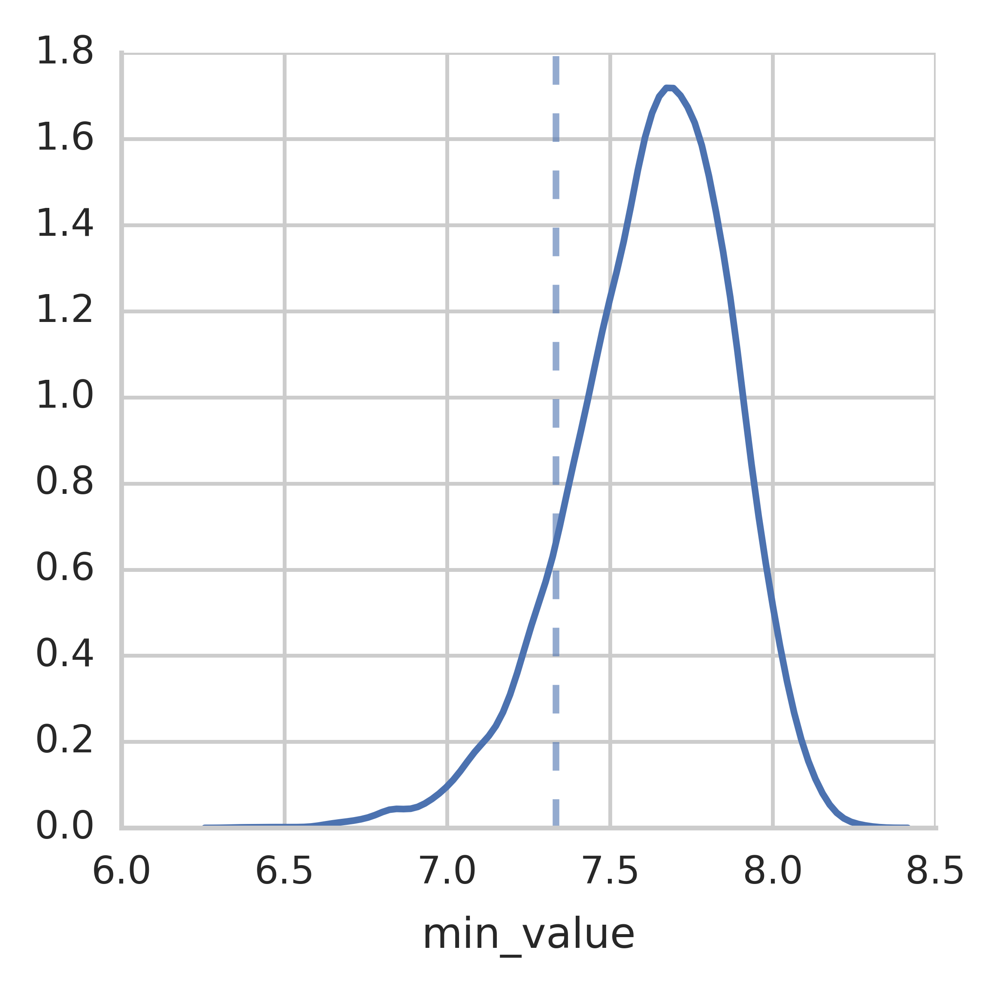

In [57]:
## how close is estimated minimum to the observed minimum?
g = seaborn.FacetGrid(data = grouped_mut_min2)
g.map(pyplot.axvline, "y_obs", linestyle = 'dashed', alpha = 0.6)
g.map(seaborn.distplot, "min_value", hist = False)

In [58]:
## how likely are we to have seen a minimum value this extreme?
## this is equal to the proportion of iterations with a value <= the observed min
observed_min2 = grouped_mut_min2.y_obs.min()
prop2 = numpy.mean(grouped_mut_min2.min_value <= observed_min2)
min(prop2, 1-prop2)

0.1168

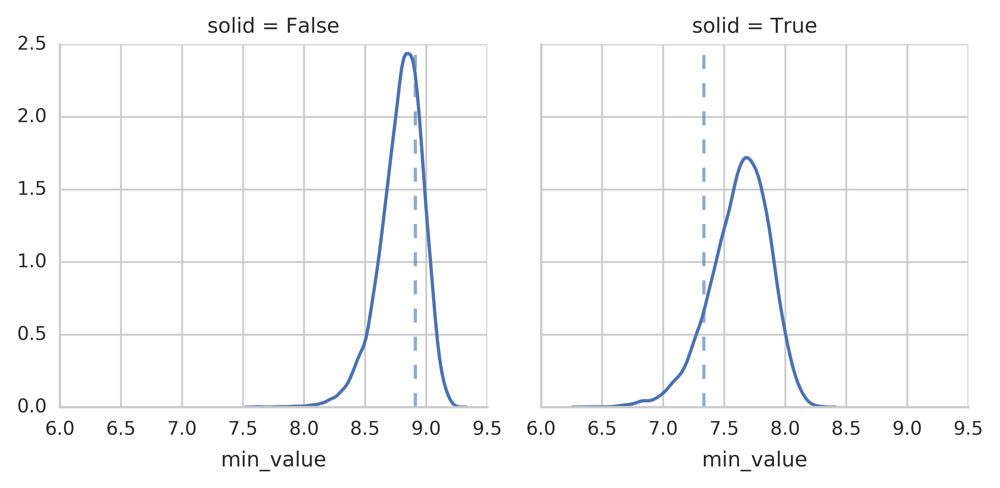

In [59]:
## now, let's repeat by ascites/solid 
g = seaborn.FacetGrid(data = grouped_muttype_min2, col = 'solid')
g.map(pyplot.axvline, "y_obs", linestyle = 'dashed', alpha = 0.6)
g.map(seaborn.distplot, "min_value", hist = False)


### modified model code to express interaction more clearly

In [60]:
def make_data3(y_column):
    stan_df = df[[y_column, "donor"] + predictors].copy()
    stan_df.columns = ["y"] + list(stan_df.columns[1:])
    stan_df["y"] = numpy.log(stan_df["y"])
    original_donors = stan_df.donor
    stan_df["low_cellularity"] = stan_df.percentage_cellularity < stan_df.dropna().percentage_cellularity.quantile(.25)
    del stan_df["percentage_cellularity"]
    stan_df["ascites"] = stan_df["tissue_type"] == "ascites"
    del stan_df["tissue_type"]
    stan_df["num_sources_for_donor"] = pandas.Series(
        [(original_donors == donor).sum() for donor in original_donors],
        index=original_donors.index)

    stan_df = stan_df.dropna()
    stan_df["donor"] = stan_df.donor.astype('category').values.codes
    stan_df["solid and treated"] = (~stan_df.ascites) & (stan_df.treated)
    stan_df["ascites and treated"] = (stan_df.ascites) & (stan_df.treated)
    del stan_df['treated']
    return stan_df

data_by_predicted3 = collections.OrderedDict()
for col in predicted:
    data_by_predicted3[col] = make_data3(col)
    print(col, data_by_predicted3[col].shape)
data_by_predicted3["mutations"].head()

('mutations', (115, 7))
('peptides', (115, 7))
('expressed peptides', (98, 7))


,y,donor,low_cellularity,ascites,num_sources_for_donor,solid and treated,ascites and treated
source_id,,,,,,,
AOCS-001-1/SP101515,8.688959,0,True,False,1,False,False
AOCS-002-1/SP101517,7.334329,1,False,False,1,False,False
AOCS-004-1/SP101519,8.822617,2,True,False,1,False,False
AOCS-005-1/SP101521,8.648748,3,False,False,1,False,False
AOCS-034-13/SP101524,9.519735,4,False,True,2,False,True


In [61]:
# stan model same as model1
model3 = model1

data = {    

}
def init(data):
    return {
        'global_mean': numpy.random.normal(0, .1),
        'donor_sigma': numpy.random.normal(1, .1),
        'sample_sigma': numpy.random.normal(1, .1),
        'donor_mean': numpy.zeros(data['num_donors']),
        'predictor_coefficients': numpy.random.normal(0, .1, size=(data['num_predictors'],)),
    }

for (i, line) in enumerate(model1.split("\n")):
    print("%3d %s" % (i + 1, line))

def print_dict(d):
    for key in [key for key in d if not isinstance(d[key], numpy.ndarray)]:
        print("%s: %s" % (key, d[key]))
    for key in [key for key in d if isinstance(d[key], numpy.ndarray)]:
        print("%s: %s mean=%s std=%s" % (key,  d[key].shape, d[key].mean(), d[key].std()))

fit_results3 = {}
for (y_label, raw_data) in data_by_predicted3.items():
    print("+" * 40)
    print("RUNNING MODEL FOR: %s" % y_label)
    df_x = raw_data[[x for x in list(raw_data.columns) if x not in ("y", "donor")]].astype(float)
    data = {
        'num_sources': len(raw_data.index),
        'num_predictors': len(df_x.columns),
        'num_donors': raw_data.donor.nunique(),

        'predictors': df_x.values.astype(float),
        'donors': raw_data.donor.values + 1,  # convert to 1-indexed
        'num_sources_for_donor': raw_data.num_sources_for_donor.values,
        'y': raw_data.y.values,
    }
    print("")
    print("*" * 40)
    print("DATA")
    print_dict(data)
    print("")

    print("*" * 40)
    print("INITIAL VALUES")
    print_dict(init(data))
    sys.stdout.flush()
    
    fit_results3[y_label] = stanity.fit(model_code=model3, data=data, init=lambda: init(data), iter=10000, chains=2)
    print("Done with fit.")
print("DONE")


  1 data {
  2     // Data sizes
  3     int<lower=0> num_sources;
  4     int<lower=0> num_predictors;
  5     int<lower=0> num_donors;
  6 
  7     // Data
  8     vector[num_predictors] predictors[num_sources];
  9     int<lower=0> donors[num_sources];
 10     real y[num_sources];  // predicted variable
 11     int<lower=1> num_sources_for_donor[num_sources];
 12 }
 13 parameters {
 14     real global_mean;
 15     real<lower=0> donor_sigma;
 16     real<lower=0> sample_sigma;
 17     vector[num_donors] donor_mean;    
 18     vector[num_predictors] predictor_coefficients;
 19 }
 20 transformed parameters {
 21     real lp;
 22     real mu[num_sources];
 23     
 24     for (i in 1:num_sources) {
 25         lp <- dot_product(predictors[i], predictor_coefficients);
 26         if (num_sources_for_donor[i] > 1) {
 27             mu[i] <- donor_mean[donors[i]] + lp;
 28         } else {
 29             mu[i] <- global_mean + lp;
 30         }
 31     }
 32 }
 33 model {
 34     global

#### compare coefficients to earlier estimates

In [62]:
all_fit_coefficients3 = []
for (y_label, fit) in fit_results3.items():
    extracted = fit.extract()
    fit_coefficients = pandas.DataFrame(numpy.exp(extracted['predictor_coefficients']),
                           columns=list(data_by_predicted3[y_label].columns)[2:])
    fit_coefficients["y_label"] = y_label
    all_fit_coefficients3.append(fit_coefficients)
all_fit_coefficients3 = pandas.concat(all_fit_coefficients3, ignore_index=True)
all_fit_coefficients3.head()

,low_cellularity,ascites,num_sources_for_donor,solid and treated,ascites and treated,y_label
0,1.078948,0.924073,1.436509,0.937609,2.115590,peptides
1,1.050005,1.238501,1.525931,1.092000,1.726433,peptides
2,0.919324,1.683083,1.425645,1.263119,1.252996,peptides
3,0.956399,1.013721,1.501609,0.871861,1.934232,peptides
4,1.011458,1.332615,1.590377,0.858380,1.347093,peptides


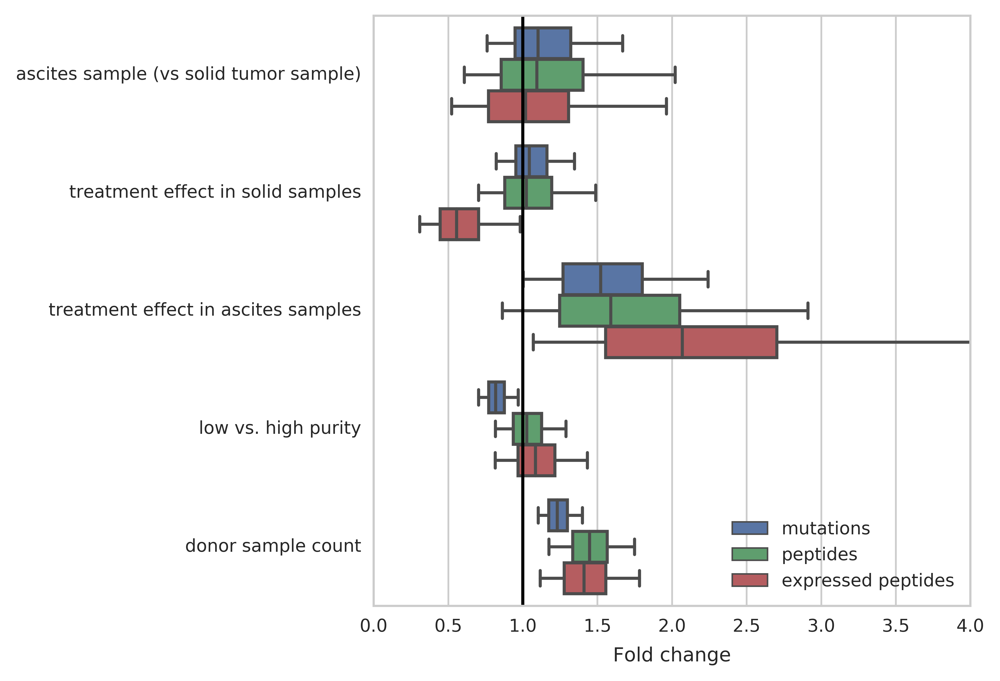

In [63]:
melted3 = pandas.melt(all_fit_coefficients3, id_vars=["y_label"])
nice_melted3 = melted3.copy()
nice_melted3.variable = nice_melted3.variable.map(lambda x: {
        "low_cellularity": "low purity",
        "num_sources_for_donor": "donor sample count"
}.get(x, x))
renames = {
    'ascites': 'ascites sample (vs solid tumor sample)',
    'ascites and treated': 'treatment effect in ascites samples',
    'solid and treated': 'treatment effect in solid samples',
    'low purity': 'low vs. high purity',
    'donor sample count': 'donor sample count',
}
nice_melted3.variable = nice_melted3.variable.map(renames)

seaborn.set_context('paper')
seaborn.set_style("whitegrid")
seaborn.boxplot(
    data=nice_melted3,
    y='variable',
    x='value',
    hue='y_label',
    order=[renames.get(x, x) for x in ["ascites",  "solid and treated", "ascites and treated", "low purity", "donor sample count"]],
    hue_order=["mutations", "peptides", "expressed peptides"],
    whis=[5, 95],
    orient='h',
    showbox=True,
    showfliers=False,
#    meanline=True,
#    showmeans=True
)
pyplot.xlim(xmin=0,xmax=4)
pyplot.ylabel("")
pyplot.xlabel("Fold change")
pyplot.legend(title=None, loc='lower right')
pyplot.axvline(1.0, color="black")
pyplot.tight_layout()

#### revisit PPD checks

In [64]:
## prep ppd data 
all_fit_yreps3 = []
for (y_label, fit) in fit_results3.items():
    extracted = fit.extract()
    
    # extract & reshape posterior predicted distribution (y-reps)
    fit_yreps = pandas.DataFrame(extracted['y_rep'],
                           columns=data_by_predicted3[y_label].index)
    fit_yreps.index.name = 'iter'
    fit_yreps_long = pandas.DataFrame(fit_yreps.stack())
    fit_yreps_long.reset_index(0, inplace = True)
    fit_ppd = fit_yreps_long
    fit_ppd.columns = ['iter','value']
    fit_ppd['variable'] = y_label
    fit_ppd['value_type'] = 'estimated'
    fit_ppd.reset_index(0, inplace = True)
    fit_ppd['y_rep'] = fit_ppd.value
    
    ## prep observed data to append to y_reps
    obs_y = pandas.DataFrame(data_by_predicted3[y_label].y)
    obs_y.columns = ['value']
    obs_y = obs_y.reset_index()
    obs_y['variable'] = y_label
    obs_y['value_type'] = 'observed'
    obs_y['iter'] = 0
    obs_y['y_obs'] = obs_y.value
    
    ## append observed & replicated data
    combined_ppd = pandas.DataFrame.append(fit_ppd, obs_y)
    
    ## append to data prepped earlier
    all_fit_yreps3.append(combined_ppd)

all_fit_yreps3 = pandas.concat(all_fit_yreps3, ignore_index=True)
all_fit_yreps3.index = all_fit_yreps3.source_id
all_fit_yreps3 = all_fit_yreps3.drop('source_id', axis = 1)
all_fit_yreps3.head()

,iter,value,value_type,variable,y_obs,y_rep
source_id,,,,,,
AOCS-001-1/SP101515,0,4.422166,estimated,peptides,NaN,4.422166
AOCS-002-1/SP101517,0,4.826721,estimated,peptides,NaN,4.826721
AOCS-004-1/SP101519,0,5.103608,estimated,peptides,NaN,5.103608
AOCS-005-1/SP101521,0,4.157452,estimated,peptides,NaN,4.157452
AOCS-034-13/SP101524,0,5.611201,estimated,peptides,NaN,5.611201


In [65]:
clin_data3 = data_by_predicted3['mutations'].drop('y',axis = 1)
plot_ppd3 = clin_data3.join(all_fit_yreps3)
plot_ppd3 = plot_ppd3.reset_index()
plot_ppd3['value_type'] = plot_ppd3['value_type'].astype('category')
plot_ppd3['variable'] = plot_ppd3['variable'].astype('category')
plot_ppd3.head()


,source_id,donor,low_cellularity,ascites,num_sources_for_donor,solid and treated,ascites and treated,iter,value,value_type,variable,y_obs,y_rep
0,AOCS-001-1/SP101515,0,True,False,1,False,False,0,4.422166,estimated,peptides,NaN,4.422166
1,AOCS-001-1/SP101515,0,True,False,1,False,False,1,3.889533,estimated,peptides,NaN,3.889533
2,AOCS-001-1/SP101515,0,True,False,1,False,False,2,3.763911,estimated,peptides,NaN,3.763911
3,AOCS-001-1/SP101515,0,True,False,1,False,False,3,3.990343,estimated,peptides,NaN,3.990343
4,AOCS-001-1/SP101515,0,True,False,1,False,False,4,5.377517,estimated,peptides,NaN,5.377517


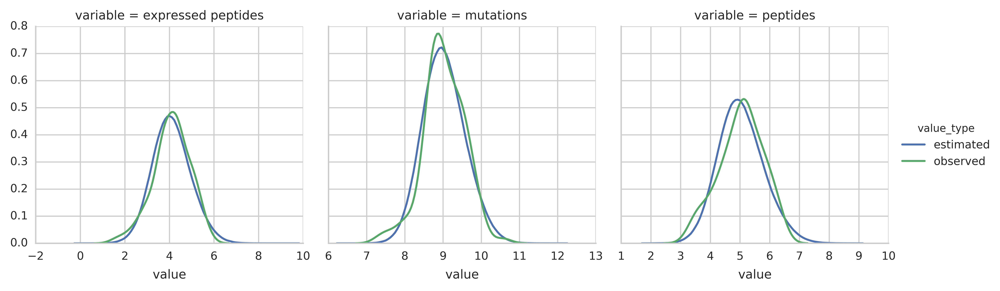

In [66]:
## plot posterior predictive checks, including all iterations
g = seaborn.FacetGrid(plot_ppd3, col="variable", hue='value_type', sharex=False,)
g.map(seaborn.distplot, "value", hist = False)
g.add_legend()


### Using PSIS-LOO to check for model fit

In [67]:
## summarize 3 models fit thus far
loosummary1 = stanity.psisloo(log_lik=fit_results['mutations'].extract()['log_lik'])
loosummary2 = stanity.psisloo(log_lik=fit_results2['mutations'].extract()['log_lik'])
loosummary3 = stanity.psisloo(log_lik=fit_results3['mutations'].extract()['log_lik'])

/usr/local/lib/python2.7/dist-packages/stanity/psis.py:228: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif sort == 'in-place':
/usr/local/lib/python2.7/dist-packages/stanity/psis.py:246: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  bs /= 3 * x[sort[np.floor(n/4 + 0.5) - 1]]


In [68]:
## compare LOOIC values for 3 models (lower is better)
## expect models 1 and 3 to be very similar, since they are basically same model
print(loosummary1.looic)
print(loosummary2.looic)
print(loosummary3.looic)

145.901372317
141.398319537
146.704475801


In [69]:
## compute portion of pareto K estimates > 0.5 and > 1 
## should be < 5% of observations with pareto-k (importance) between 0.5 and 1
## having ALL values < 0.5 is ideal
##    this means the LOO estimate above is correct & there aren't overly influential observations in the dataset
print(loosummary1.print_summary())
print(loosummary2.print_summary())
print(loosummary3.print_summary())


greater than 0.5    0.008696
greater than 1      0.000000
dtype: float64
greater than 0.5    0.0
greater than 1      0.0
dtype: float64
greater than 0.5    0.008696
greater than 1      0.000000
dtype: float64


In [70]:
## how much better is model2 than model1?
print(stanity.loo_compare(loosummary1, loosummary2))

{'diff': 2.2515263896619047, 'se_diff': 2.4960115122464588}


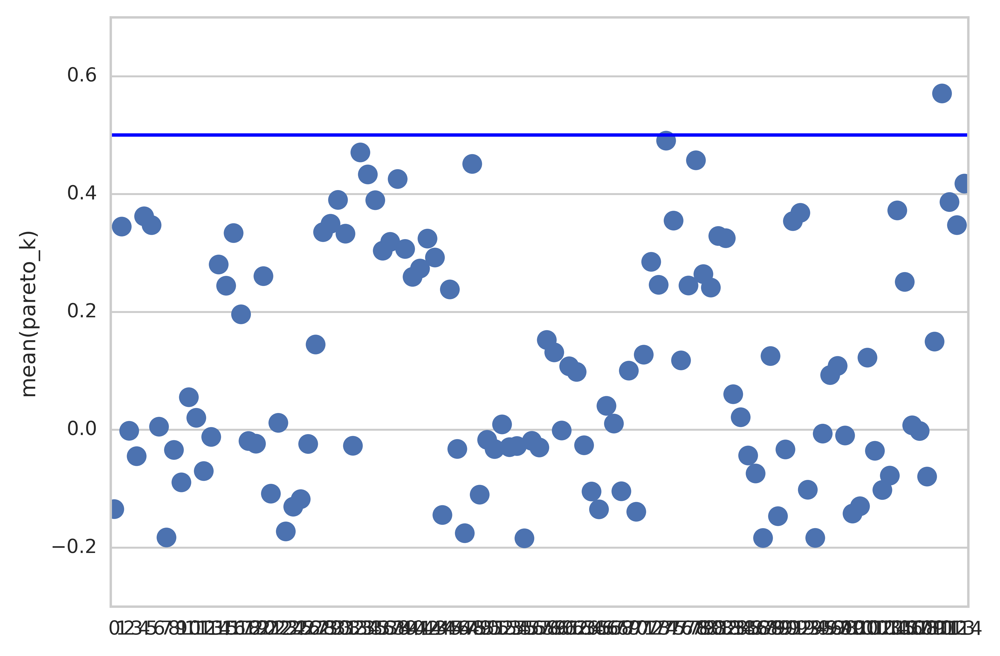

In [71]:
## look at distribution of importance-sampling for model1
## X axis is an index, but can alternatively plot by features (e.g. treated vs non-treated)
loosummary1.plot()
pyplot.axhline(0.5)